In [36]:
import pickle
import numpy as np
from sklearn.model_selection import train_test_split
import data
import os
import embedding
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ridge_utils.ridge import bootstrap_ridge, ridge_corr, ridge_corr_pred, zs
from transformers import (
    BertTokenizer, BertForMaskedLM,
    Trainer, TrainingArguments,
    DataCollatorForLanguageModeling,
    BertTokenizerFast
)
from datasets import Dataset
from peft import PeftModel, get_peft_model, LoraConfig, TaskType
import shap

In [37]:
with open("../data/raw_text.pkl", "rb") as file:
    rawdata = pickle.load(file)

In [38]:
del rawdata['dialogue1']
del rawdata['dialogue2']
del rawdata['dialogue3']
del rawdata['dialogue4']
del rawdata['dialogue5']
del rawdata['dialogue6']
del rawdata['myfirstdaywiththeyankees']
del rawdata['onlyonewaytofindout']

In [39]:
full_stories = list(rawdata.keys())
train_stories, test_stories = train_test_split(full_stories, test_size = 0.3, random_state = 1)

print(len(train_stories))
print(len(test_stories))

model_train_stories, model_eval_stories = train_test_split(train_stories, test_size = 0.3, random_state = 1)

print(len(model_train_stories))
print(len(model_eval_stories))

70
31
49
21


In [40]:
train_sentences = data.split_based_on_flags(rawdata, model_train_stories, 0.7, 30, 100)
eval_sentences = data.split_based_on_flags(rawdata, model_eval_stories, 0.7, 30, 100)

In [41]:
base_model = BertForMaskedLM.from_pretrained("bert-base-uncased")
model = PeftModel.from_pretrained(base_model, "./lora-bert-mlm-final")
model.eval()


tokenizer = BertTokenizerFast.from_pretrained("bert-base-uncased")

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForMaskedLM: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
finetuned_embedding_train = embedding.auto_embeddings_finetuned(rawdata, model, tokenizer, train_stories, delay = [1, 2, 3, 4])
finetuned_embedding_test = embedding.auto_embeddings_finetuned(rawdata, model, tokenizer, test_stories, delay = [1, 2, 3, 4])

/jet/home/kxu5/code/embedding.py:160: RuntimeWarning: invalid value encountered in divide
  embed = np.where(count[:, np.newaxis] != 0, embed / count[:, np.newaxis], 0)


In [ ]:
finetuned_embedding_train["sweetaspie"]

In [ ]:

def load_measurement_data_by_subject(story_key):
    """Load measurement data and return it separated by subject."""
    base_dir = "../tmp_ondemand_ocean_mth240012p_symlink/shared/data"
    subject2_file = os.path.join(base_dir, "subject2", f"{story_key}.npy")
    subject3_file = os.path.join(base_dir, "subject3", f"{story_key}.npy")
    
    subject2_data = None
    subject3_data = None
    
    if os.path.exists(subject2_file):
        subject2_data = np.load(subject2_file)
        print(f"Loaded subject2 data for '{story_key}'")
    
    if os.path.exists(subject3_file):
        subject3_data = np.load(subject3_file)
        print(f"Loaded subject3 data for '{story_key}'")
    
    return subject2_data, subject3_data

# Load first 6 keys for train and first 2 keys for test
train_keys = list(finetuned_embedding_train.keys())
test_keys = list(finetuned_embedding_test.keys())

# Initialize lists to store data for each subject
subject2_train_rows = []
subject3_train_rows = []
subject2_test_rows = []
subject3_test_rows = []

# Process training data
print("\nProcessing training data:")
for story_key in train_keys:
    subject2_data, subject3_data = load_measurement_data_by_subject(story_key)
    
    if subject2_data is not None:
        subject2_train_rows.append({
            'story_key': story_key,
            'measurement_data': subject2_data
        })
    
    if subject3_data is not None:
        subject3_train_rows.append({
            'story_key': story_key,
            'measurement_data': subject3_data
        })

# Process test data
print("\nProcessing test data:")
for story_key in test_keys:
    subject2_data, subject3_data = load_measurement_data_by_subject(story_key)
    
    if subject2_data is not None:
        subject2_test_rows.append({
            'story_key': story_key,
            'measurement_data': subject2_data
        })
    
    if subject3_data is not None:
        subject3_test_rows.append({
            'story_key': story_key,
            'measurement_data': subject3_data
        })

# Create DataFrames for each subject
train_resp_subject2 = pd.DataFrame(subject2_train_rows).set_index('story_key')
train_resp_subject3 = pd.DataFrame(subject3_train_rows).set_index('story_key')
test_resp_subject2 = pd.DataFrame(subject2_test_rows).set_index('story_key')
test_resp_subject3 = pd.DataFrame(subject3_test_rows).set_index('story_key')

# Print summary
print("\nDataset Summary:")
print(f"Subject 2 training stories: {len(train_resp_subject2)}")
print(f"Subject 3 training stories: {len(train_resp_subject3)}")
print(f"Subject 2 test stories: {len(test_resp_subject2)}")
print(f"Subject 3 test stories: {len(test_resp_subject3)}")

print("\nTraining stories for Subject 2:", list(train_resp_subject2.index))
print("Training stories for Subject 3:", list(train_resp_subject3.index))
print("\nTest stories for Subject 2:", list(test_resp_subject2.index))
print("Test stories for Subject 3:", list(test_resp_subject3.index))

# Print shapes of measurement data
print("\nMeasurement data shapes:")
if len(train_resp_subject2) > 0:
    print(f"Subject 2 training shape: {train_resp_subject2.iloc[0]['measurement_data'].shape}")
if len(train_resp_subject3) > 0:
    print(f"Subject 3 training shape: {train_resp_subject3.iloc[0]['measurement_data'].shape}")

Loaded subject2 data for 'christmas1940'


Loaded subject3 data for 'christmas1940'


Loaded subject2 data for 'canplanetearthfeedtenbillionpeoplepart1'


Loaded subject3 data for 'canplanetearthfeedtenbillionpeoplepart1'


Loaded subject2 data for 'firetestforlove'


Loaded subject3 data for 'firetestforlove'


Loaded subject2 data for 'eyespy'


Loaded subject3 data for 'eyespy'


Loaded subject2 data for 'naked'


Loaded subject3 data for 'naked'


Loaded subject2 data for 'canadageeseandddp'


Loaded subject3 data for 'canadageeseandddp'


Loaded subject2 data for 'theinterview'


Loaded subject3 data for 'theinterview'


Loaded subject2 data for 'thecurse'


Loaded subject3 data for 'thecurse'


Loaded subject2 data for 'swimmingwithastronauts'


Loaded subject3 data for 'swimmingwithastronauts'


Loaded subject2 data for 'adollshouse'


Loaded subject3 data for 'adollshouse'


Loaded subject2 data for 'afatherscover'


Loaded subject3 data for 'afatherscover'


Loaded subject2 data for 'howtodraw'


Loaded subject3 data for 'howtodraw'


Loaded subject2 data for 'life'


Loaded subject3 data for 'life'


Loaded subject2 data for 'whenmothersbullyback'


Loaded subject3 data for 'whenmothersbullyback'


Loaded subject2 data for 'gpsformylostidentity'


Loaded subject3 data for 'gpsformylostidentity'


Loaded subject2 data for 'bluehope'


Loaded subject3 data for 'bluehope'


Loaded subject2 data for 'lawsthatchokecreativity'


Loaded subject3 data for 'lawsthatchokecreativity'


Loaded subject2 data for 'singlewomanseekingmanwich'


Loaded subject3 data for 'singlewomanseekingmanwich'


Loaded subject2 data for 'buck'


Loaded subject3 data for 'buck'


Loaded subject2 data for 'thesurprisingthingilearnedsailingsoloaroundtheworld'


Loaded subject3 data for 'thesurprisingthingilearnedsailingsoloaroundtheworld'


Loaded subject2 data for 'seedpotatoesofleningrad'


Loaded subject3 data for 'seedpotatoesofleningrad'


Loaded subject2 data for 'thetiniestbouquet'


Loaded subject3 data for 'thetiniestbouquet'


Loaded subject2 data for 'indianapolis'


Loaded subject3 data for 'indianapolis'


Loaded subject2 data for 'mybackseatviewofagreatromance'


Loaded subject3 data for 'mybackseatviewofagreatromance'


Loaded subject2 data for 'gangstersandcookies'


Loaded subject3 data for 'gangstersandcookies'


Loaded subject2 data for 'theshower'


Loaded subject3 data for 'theshower'


Loaded subject2 data for 'becomingindian'


Loaded subject3 data for 'becomingindian'


Loaded subject2 data for 'cocoonoflove'


Loaded subject3 data for 'cocoonoflove'


Loaded subject2 data for 'adventuresinsayingyes'


Loaded subject3 data for 'adventuresinsayingyes'


Loaded subject2 data for 'sweetaspie'


Loaded subject3 data for 'sweetaspie'


Loaded subject2 data for 'stagefright'


Loaded subject3 data for 'stagefright'


Loaded subject2 data for 'treasureisland'


Loaded subject3 data for 'treasureisland'


Loaded subject2 data for 'onapproachtopluto'


Loaded subject3 data for 'onapproachtopluto'


Loaded subject2 data for 'theadvancedbeginner'


Loaded subject3 data for 'theadvancedbeginner'


Loaded subject2 data for 'undertheinfluence'


Loaded subject3 data for 'undertheinfluence'


Loaded subject2 data for 'shoppinginchina'


Loaded subject3 data for 'shoppinginchina'


Loaded subject2 data for 'notontheusualtour'


Loaded subject3 data for 'notontheusualtour'


Loaded subject2 data for 'kiksuya'


Loaded subject3 data for 'kiksuya'


Loaded subject2 data for 'legacy'


Loaded subject3 data for 'legacy'


Loaded subject2 data for 'food'


Loaded subject3 data for 'food'


Loaded subject2 data for 'haveyoumethimyet'


Loaded subject3 data for 'haveyoumethimyet'


Loaded subject2 data for 'mayorofthefreaks'


Loaded subject3 data for 'mayorofthefreaks'


Loaded subject2 data for 'avatar'


Loaded subject3 data for 'avatar'


Loaded subject2 data for 'thepostmanalwayscalls'


Loaded subject3 data for 'thepostmanalwayscalls'


Loaded subject2 data for 'canplanetearthfeedtenbillionpeoplepart2'


Loaded subject3 data for 'canplanetearthfeedtenbillionpeoplepart2'


Loaded subject2 data for 'goldiethegoldfish'


Loaded subject3 data for 'goldiethegoldfish'


Loaded subject2 data for 'odetostepfather'


Loaded subject3 data for 'odetostepfather'


Loaded subject2 data for 'superheroesjustforeachother'


Loaded subject3 data for 'superheroesjustforeachother'


Loaded subject2 data for 'jugglingandjesus'


Loaded subject3 data for 'jugglingandjesus'


Loaded subject2 data for 'listo'


Loaded subject3 data for 'listo'


Loaded subject2 data for 'quietfire'


Loaded subject3 data for 'quietfire'


Loaded subject2 data for 'thatthingonmyarm'


Loaded subject3 data for 'thatthingonmyarm'


Loaded subject2 data for 'againstthewind'


Loaded subject3 data for 'againstthewind'


Loaded subject2 data for 'leavingbaghdad'


Loaded subject3 data for 'leavingbaghdad'


Loaded subject2 data for 'wheretheressmoke'


Loaded subject3 data for 'wheretheressmoke'


Loaded subject2 data for 'golfclubbing'


Loaded subject3 data for 'golfclubbing'


Loaded subject2 data for 'birthofanation'


Loaded subject3 data for 'birthofanation'


Loaded subject2 data for 'hangtime'


Loaded subject3 data for 'hangtime'


Loaded subject2 data for 'thesecrettomarriage'


Loaded subject3 data for 'thesecrettomarriage'


Loaded subject2 data for 'stumblinginthedark'


Loaded subject3 data for 'stumblinginthedark'


Loaded subject2 data for 'exorcism'


Loaded subject3 data for 'exorcism'

Processing test data:


Loaded subject2 data for 'backsideofthestorm'


Loaded subject3 data for 'backsideofthestorm'


Loaded subject2 data for 'escapingfromadirediagnosis'


Loaded subject3 data for 'escapingfromadirediagnosis'


Loaded subject2 data for 'tetris'


Loaded subject3 data for 'tetris'


Loaded subject2 data for 'sloth'


Loaded subject3 data for 'sloth'


Loaded subject2 data for 'thefreedomridersandme'


Loaded subject3 data for 'thefreedomridersandme'


Loaded subject2 data for 'findingmyownrescuer'


Loaded subject3 data for 'findingmyownrescuer'


Loaded subject2 data for 'fromboyhoodtofatherhood'


Loaded subject3 data for 'fromboyhoodtofatherhood'


Loaded subject2 data for 'myfathershands'


Loaded subject3 data for 'myfathershands'


Loaded subject2 data for 'learninghumanityfromdogs'


Loaded subject3 data for 'learninghumanityfromdogs'


Loaded subject2 data for 'theclosetthatateeverything'


Loaded subject3 data for 'theclosetthatateeverything'


Loaded subject2 data for 'lifereimagined'


Loaded subject3 data for 'lifereimagined'


Loaded subject2 data for 'vixenandtheussr'


Loaded subject3 data for 'vixenandtheussr'


Loaded subject2 data for 'breakingupintheageofgoogle'


Loaded subject3 data for 'breakingupintheageofgoogle'


Loaded subject2 data for 'marryamanwholoveshismother'


Loaded subject3 data for 'marryamanwholoveshismother'


Loaded subject2 data for 'thetriangleshirtwaistconnection'


Loaded subject3 data for 'thetriangleshirtwaistconnection'


Loaded subject2 data for 'goingthelibertyway'


Loaded subject3 data for 'goingthelibertyway'


Loaded subject2 data for 'lifeanddeathontheoregontrail'


Loaded subject3 data for 'lifeanddeathontheoregontrail'


Loaded subject2 data for 'cautioneating'


Loaded subject3 data for 'cautioneating'


Loaded subject2 data for 'metsmagic'


Loaded subject3 data for 'metsmagic'


Loaded subject2 data for 'whyimustspeakoutaboutclimatechange'


Loaded subject3 data for 'whyimustspeakoutaboutclimatechange'


Loaded subject2 data for 'waitingtogo'


Loaded subject3 data for 'waitingtogo'


Loaded subject2 data for 'forgettingfear'


Loaded subject3 data for 'forgettingfear'


Loaded subject2 data for 'afearstrippedbare'


Loaded subject3 data for 'afearstrippedbare'


Loaded subject2 data for 'inamoment'


Loaded subject3 data for 'inamoment'


Loaded subject2 data for 'itsabox'


Loaded subject3 data for 'itsabox'


Loaded subject2 data for 'catfishingstrangerstofindmyself'


Loaded subject3 data for 'catfishingstrangerstofindmyself'


Loaded subject2 data for 'ifthishaircouldtalk'


Loaded subject3 data for 'ifthishaircouldtalk'


Loaded subject2 data for 'beneaththemushroomcloud'


Loaded subject3 data for 'beneaththemushroomcloud'


Loaded subject2 data for 'tildeath'


Loaded subject3 data for 'tildeath'


Loaded subject2 data for 'reachingoutbetweenthebars'


Loaded subject3 data for 'reachingoutbetweenthebars'


Loaded subject2 data for 'comingofageondeathrow'


Loaded subject3 data for 'comingofageondeathrow'

Dataset Summary:
Subject 2 training stories: 70
Subject 3 training stories: 70
Subject 2 test stories: 31
Subject 3 test stories: 31

Training stories for Subject 2: ['googlingstrangersandkentuckybluegrass', 'alternateithicatom', 'thumbsup', 'igrewupinthewestborobaptistchurch', 'penpal', 'wildwomenanddancingqueens', 'canplanetearthfeedtenbillionpeoplepart3', 'souls', 'threemonths', 'christmas1940', 'canplanetearthfeedtenbillionpeoplepart1', 'firetestforlove', 'eyespy', 'naked', 'canadageeseandddp', 'theinterview', 'thecurse', 'swimmingwithastronauts', 'adollshouse', 'afatherscover', 'howtodraw', 'life', 'whenmothersbullyback', 'gpsformylostidentity', 'bluehope', 'lawsthatchokecreativity', 'singlewomanseekingmanwich', 'buck', 'thesurprisingthingilearnedsailingsoloaroundtheworld', 'seedpotatoesofleningrad', 'thetiniestbouquet', 'indianapolis', 'mybackseatviewofagreatromance', 'gangstersandcookies', 'theshower', 'becomingindian', 'cocoonof

In [ ]:

# Create results directory
os.makedirs('../results', exist_ok=True)

# Create figs directory
os.makedirs('../figs', exist_ok=True)

# Constants
ALPHAS = np.logspace(1, 3, 3)  # [10, 100, 1000]
NBOOTS = 3
CHUNKLEN = 10
CC_THRESHOLD = 0.1  # Updated threshold from 0.2 to 0.1

def evaluate_embedding(train_embed, test_embed, train_resp, test_resp, embed_name, subject_name):
    """Efficient evaluation with focused output."""
    print(f"\n{'='*50}")
    print(f"Evaluating {embed_name} embedding for {subject_name}")
    
    # Data preparation
    train_keys = sorted(set(train_embed.keys()) & set(train_resp.index))
    test_keys = sorted(set(test_embed.keys()) & set(test_resp.index))
    
    print(f"\nNumber of stories - Train: {len(train_keys)}, Test: {len(test_keys)}")
    
    X_train_list, y_train_list = [], []
    X_test_dict, y_test_dict = {}, {}
    
    # Prepare training data
    for key in train_keys:
        embed = train_embed[key]
        resp = train_resp.loc[key, 'measurement_data']
        min_len = min(embed.shape[0], resp.shape[0])
        X_train_list.append(embed[:min_len])
        y_train_list.append(resp[:min_len])
    
    # Prepare test data
    for key in test_keys:
        embed = test_embed[key]
        resp = test_resp.loc[key, 'measurement_data']
        min_len = min(embed.shape[0], resp.shape[0])
        X_test_dict[key] = embed[:min_len]
        y_test_dict[key] = resp[:min_len]
    
    X_train = np.vstack(X_train_list)
    y_train = np.vstack(y_train_list)
    X_test = np.vstack(list(X_test_dict.values()))
    y_test = np.vstack(list(y_test_dict.values()))
    
    print(f"Data dimensions:")
    print(f"Training: {X_train.shape[0]} timepoints × {X_train.shape[1]} features → {y_train.shape[1]} voxels")
    print(f"Testing:  {X_test.shape[0]} timepoints × {X_test.shape[1]} features → {y_test.shape[1]} voxels")
    
    # Cross-validation
    n_splits = 3
    chunk_size = len(X_train) // n_splits
    cv_scores = []
    
    print("\nRunning cross-validation...")
    for i in range(n_splits):
        val_start = i * chunk_size
        val_end = (i + 1) * chunk_size
        
        X_val = X_train[val_start:val_end]
        y_val = y_train[val_start:val_end]
        X_train_cv = np.vstack([X_train[:val_start], X_train[val_end:]])
        y_train_cv = np.vstack([y_train[:val_start], y_train[val_end:]])
        
        wt_cv, corrs_cv, _, _, _ = bootstrap_ridge(
            X_train_cv, y_train_cv, X_val, y_val,
            alphas=ALPHAS, nboots=NBOOTS, chunklen=CHUNKLEN,
            nchunks=3, corrmin=CC_THRESHOLD, normalpha=True
        )
        cv_scores.append(np.mean(corrs_cv))
    
    print(f"CV mean CC: {np.mean(cv_scores):.4f} (±{np.std(cv_scores):.4f})")
    
    # Final model training
    print("\nTraining final model...")
    wt, corrs, valphas, allRcorrs, _ = bootstrap_ridge(
        X_train, y_train, X_test, y_test,
        alphas=ALPHAS, nboots=NBOOTS, chunklen=CHUNKLEN,
        nchunks=3, corrmin=CC_THRESHOLD, normalpha=True
    )
    
    # Per-story analysis
    story_performances = {}
    story_boundaries = np.cumsum([0] + [len(X_test_dict[k]) for k in test_keys])
    
    print("\nPer-story performance:")
    for i, key in enumerate(test_keys):
        story_corrs = corrs[story_boundaries[i]:story_boundaries[i+1]]
        story_performances[key] = {
            'mean_cc': np.nanmean(story_corrs),
            'median_cc': np.nanmedian(story_corrs),
            'std_cc': np.nanstd(story_corrs),
            'n_voxels': len(story_corrs),
            'correlations': story_corrs
        }
        print(f"Story {i+1}: mean CC = {story_performances[key]['mean_cc']:.4f} ± {story_performances[key]['std_cc']:.4f}")
    
    # Compute metrics
    metrics = {
        'mean_cc': np.nanmean(corrs),
        'median_cc': np.nanmedian(corrs),
        'top_1_percentile': np.nanpercentile(corrs, 99),
        'top_5_percentile': np.nanpercentile(corrs, 95),
        'correlations': corrs,
        'cv_scores': cv_scores,
        'story_performances': story_performances,
        'voxels_above_threshold': np.mean(corrs > CC_THRESHOLD) * 100
    }
    
    # Save model
    model_data = {
        'weights': wt,
        'best_alphas': valphas,
        'metrics': metrics,
        'training_shapes': {'X': X_train.shape, 'y': y_train.shape}
    }
    
    with open(f'../results/ridge_model_{subject_name}_{embed_name}.pkl', 'wb') as f:
        pickle.dump(model_data, f)
    
    # Plotting
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # CC Distribution
    sns.histplot(corrs[~np.isnan(corrs)], bins=50, kde=True, ax=ax1)
    ax1.axvline(x=CC_THRESHOLD, color='r', linestyle='--', label=f'CC={CC_THRESHOLD}')
    ax1.set_title(f'CC Distribution\n{subject_name} - {embed_name}')
    ax1.set_xlabel('Correlation Coefficient')
    ax1.legend()
    
    # Story Performance with numerical indices
    story_means = [perf['mean_cc'] for perf in story_performances.values()]
    story_stds = [perf['std_cc'] for perf in story_performances.values()]
    x_pos = np.arange(1, len(story_means) + 1)
    
    ax2.bar(x_pos, story_means, yerr=story_stds, capsize=5)
    ax2.set_title('Per-story Performance')
    ax2.set_xlabel('Story Number')
    ax2.set_ylabel('Mean CC (with std)')
    ax2.set_xticks(x_pos)
    
    plt.tight_layout()
    
    # Save figure as PNG in ../figs directory
    fig.savefig(os.path.join('../figs', f"{subject_name}_{embed_name}.png"), dpi=300)
    
    # Display figure
    plt.show()
    
    # Print final results
    print("\nResults Summary:")
    print(f"Mean CC: {metrics['mean_cc']:.4f}")
    print(f"Median CC: {metrics['median_cc']:.4f}")
    print(f"Top 1% CC: {metrics['top_1_percentile']:.4f}")
    print(f"Top 5% CC: {metrics['top_5_percentile']:.4f}")
    print(f"Voxels with CC > {CC_THRESHOLD}: {metrics['voxels_above_threshold']:.1f}%")
    
    return metrics

# Main execution
subjects_to_analyze = {
    'subject2': (train_resp_subject2, test_resp_subject2),
    'subject3': (train_resp_subject3, test_resp_subject3)
}

embedding_pairs = {
    'BERT': (finetuned_embedding_train, finetuned_embedding_test)
}

# Run analysis
all_results = {}
for subject_name, (train_resp, test_resp) in subjects_to_analyze.items():
    print(f"\n{'='*20} Analyzing {subject_name} {'='*20}")
    
    subject_results = {}
    for embed_name, (train_embed, test_embed) in embedding_pairs.items():
        subject_results[embed_name] = evaluate_embedding(
            train_embed, test_embed,
            train_resp, test_resp,
            embed_name, subject_name
        )
    
    all_results[subject_name] = subject_results

# Final cross-subject comparison
print("\n=== Final Cross-subject Comparison ===")
for embed_name in embedding_pairs:
    print(f"\n{embed_name}:")
    for subject_name in subjects_to_analyze:
        metrics = all_results[subject_name][embed_name]
        print(f"{subject_name}:")
        print(f"  Mean CC: {metrics['mean_cc']:.4f}")
        print(f"  Voxels > {CC_THRESHOLD}: {metrics['voxels_above_threshold']:.1f}%")

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import os

# Choose a test story to analyze
test_story_key = 'tetris' 

# Load the saved model data
subject = 'subject3'
model_path = f'../results/ridge_model_{subject}_BERT.pkl'

with open(model_path, 'rb') as f:
    model_data = pickle.load(f)

# Get voxel performance for this story
story_performances = model_data['metrics']['story_performances']
story_voxel_corrs = story_performances[test_story_key]['correlations']

# Select top-N voxels where model performs well
top_n = 3
top_voxel_indices = np.argsort(story_voxel_corrs)[-top_n:][::-1]
top_voxel_corrs = story_voxel_corrs[top_voxel_indices]

print(f"Analysis for test story: '{test_story_key}'")
print(f"Top {top_n} voxels:")
for i, (idx, corr) in enumerate(zip(top_voxel_indices, top_voxel_corrs)):
    print(f"  Voxel {idx}: correlation = {corr:.4f}")

Analysis for test story: 'tetris'
Top 3 voxels:
  Voxel 127: correlation = 0.0899
  Voxel 128: correlation = 0.0703
  Voxel 265: correlation = 0.0582


In [47]:
from transformers import AutoTokenizer, AutoModel
import torch
import numpy as np

# Get the story text using the same approach as shown
story_words = rawdata[test_story_key].data
test_story_text = " ".join(story_words)

print(f"Selected story: {test_story_key}")
print(f"Story length: {len(story_words)} words")
print("First 100 words:", " ".join(story_words[:100]), "...")

# Setup BERT tokenizer
tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')

# Function to predict voxel activation
def predict_voxel_simplified(texts, voxel_idx):
    """
    Predict activation for a list of text inputs for a specific voxel.
    Returns a NumPy array of predictions.
    """
    preds = []

    for text in texts:
        inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=512)

        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            last_hidden = outputs.hidden_states[-1]  # get last hidden state
            embeddings = last_hidden.mean(dim=1).numpy()

        if model_data['weights'].shape[0] == 3072:
            extended_embed = np.tile(embeddings, (1, 4)).reshape(-1)
        else:
            extended_embed = embeddings.reshape(-1)

        weights = model_data['weights'][:, voxel_idx]
        pred = np.dot(extended_embed, weights)
        preds.append(pred)

    return np.array(preds)

    return np.array(preds)


Selected story: tetris
Story length: 1350 words
First 100 words:  let's start with tetris in june of nineteen eighty four the computer programmer alexey pajitnov was working for the soviet academy of sciences in moscow he was twenty eight years old and a bit of a puzzle nerd to test the capabilities of the computers he worked on pajitnov liked to create simple games and that month he developed a game in which the player had to fit various kinds of tetraminoes together a tetramino being a shape composed of four connected squares tetraminoes come in seven possible configurations and tetris has all of them your job is to ...


# SHAP TEST STORY 1: tetris

## SHAP (test_story: 'tetris', Voxel: 127)

Analyzing text with 1348 words for voxel 127
Empty baseline prediction: -1.0187397613104145e-10
Full text prediction: -2.8614442692738074e-10
Difference from baseline: -1.842704507963393e-10
Created 4 chunks for analysis
Chunk 1: words 0-450, prediction: -2.8614442692738074e-10
Chunk 2: words 400-850, prediction: -2.920547129589206e-10


Token indices sequence length is longer than the specified maximum sequence length for this model (526 > 512). Running this sequence through the model will result in indexing errors


Chunk 3: words 800-1250, prediction: -3.18373181099127e-10
Chunk 4: words 1200-1348, prediction: -3.165406960856776e-10

Analyzing Chunk 3 (words 800-1250, importance: 0.0000)
a high scoring accomplishment called a tetris as a kid i played tetris on my nintendo entertainment ...


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:59, 119.73s/it]              


SHAP Text Highlighting (blue = higher than chunk average, red = lower):



Top words with higher activation than chunk average:
  much: 2.910641023510e-13
  nintendo: 2.910641023510e-13
  entertainment: 2.910641023510e-13
  system: 2.910641023510e-13
  gameboy: 2.910641023510e-13
  so: 1.952342470170e-13
  building: 1.943949909665e-13
  begins: 1.943949909665e-13
  anew: 1.943949909665e-13
  lines: 1.943949909665e-13

Top words with lower activation than chunk average:
  garden: -4.347428488507e-13
  eat: -4.347428488507e-13
  love: -4.347428488507e-13
  write: -4.347428488507e-13
  read: -4.347428488507e-13
  occasionally: -4.273193589705e-13
  gets: -4.273193589705e-13
  bad: -4.273193589705e-13
  enough: -4.273193589705e-13
  never: -4.273193589705e-13


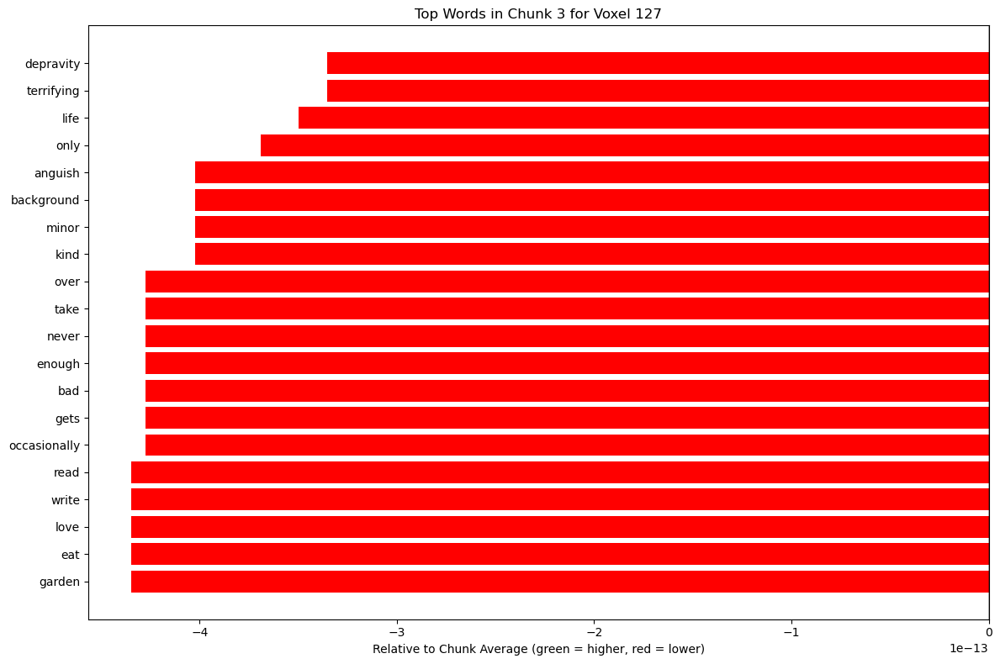

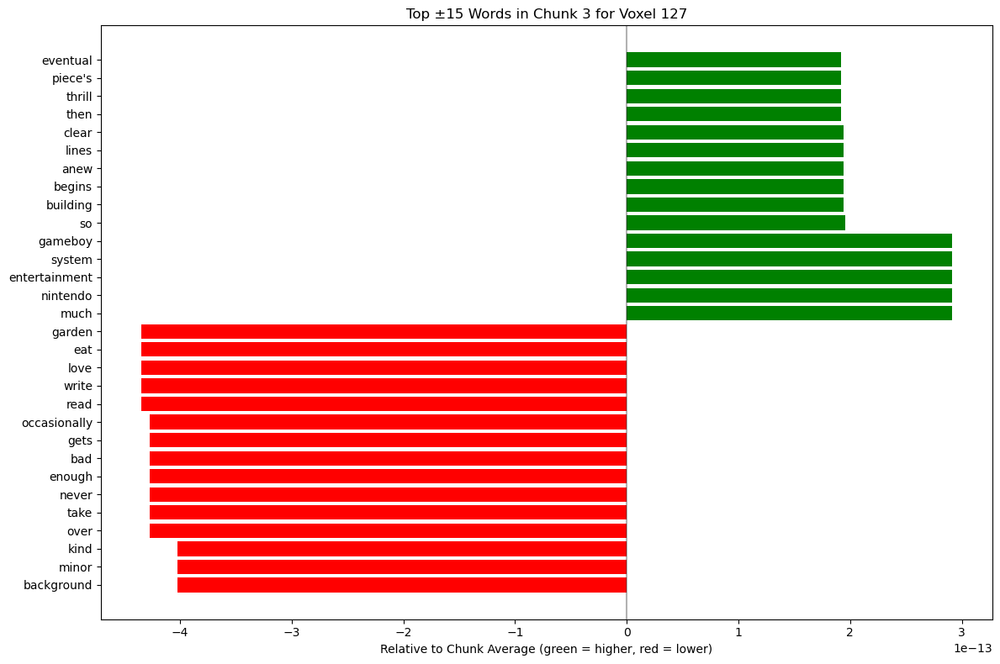


Analyzing Chunk 4 (words 1200-1348, importance: 0.0000)
of course such pain must be confronted and dealt with carefully considered and battled against there...


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:01, 61.23s/it]               


SHAP Text Highlighting (blue = higher than chunk average, red = lower):



Top words with higher activation than chunk average:
  get: 4.628852124062e-13
  i'm: 3.620737940180e-13
  ever: 3.620737940180e-13
  going: 3.620737940180e-13
  four: 3.410102759226e-13
  half: 3.410102759226e-13
  stars: 3.410102759226e-13
  as: 3.194918707059e-13
  such: 3.032412479577e-13
  close: 2.769099473939e-13

Top words with lower activation than chunk average:
  background: -1.381731441024e-12
  when: -1.334232240007e-12
  world: -1.202290465834e-12
  because: -1.202290465834e-12
  become: -1.006544326257e-12
  too: -1.006544326257e-12
  powerful: -1.006544326257e-12
  they: -1.006544326257e-12
  can: -9.481169398342e-13
  building: -9.408901817266e-13


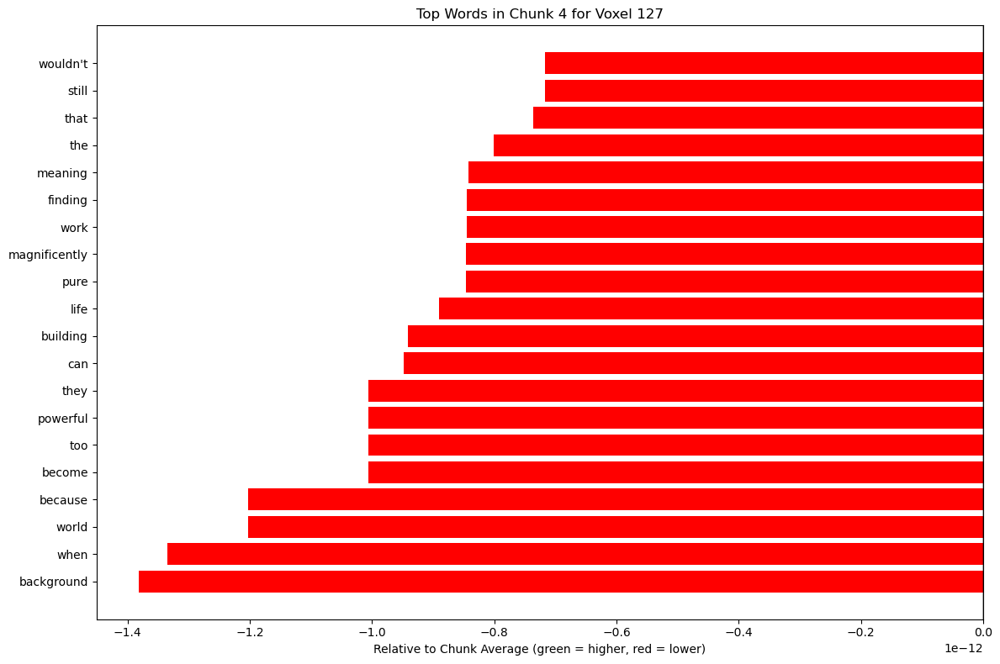

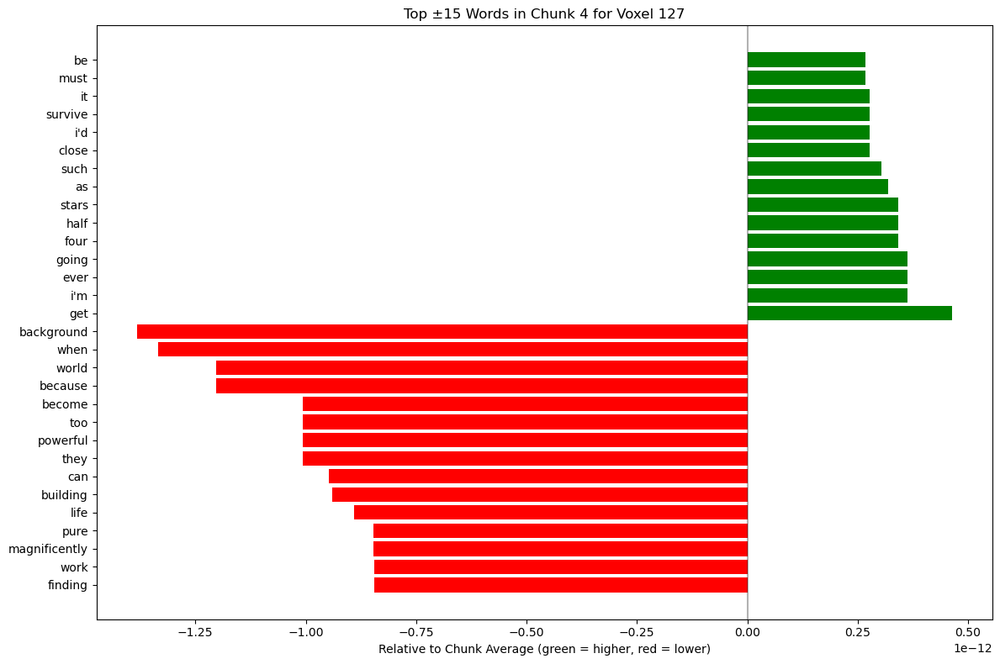


Analyzing Chunk 2 (words 400-850, importance: 0.0000)
and continued to work for the state he developed a three dimensional sequel to tetris named welltris...


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:58, 118.95s/it]              


SHAP Text Highlighting (blue = higher than chunk average, red = lower):



Top words with higher activation than chunk average:
  named: 3.233921114303e-13
  challenging: 3.146612727126e-13
  complex: 3.146612727126e-13
  was: 2.504972666622e-13
  welltris: 2.335680233583e-13
  state: 2.066761581576e-13
  developed: 2.066761581576e-13
  three: 2.066761581576e-13
  dimensional: 2.066761581576e-13
  sequel: 2.066761581576e-13

Top words with lower activation than chunk average:
  together: -6.207612775752e-13
  form: -6.207612775752e-13
  horizontal: -6.207612775752e-13
  gets: -5.707021505369e-13
  disappear: -5.512799088040e-13
  expert: -5.512799088040e-13
  players: -5.512799088040e-13
  complete: -5.465656182202e-13
  while: -5.465656182202e-13
  waiting: -5.465656182202e-13


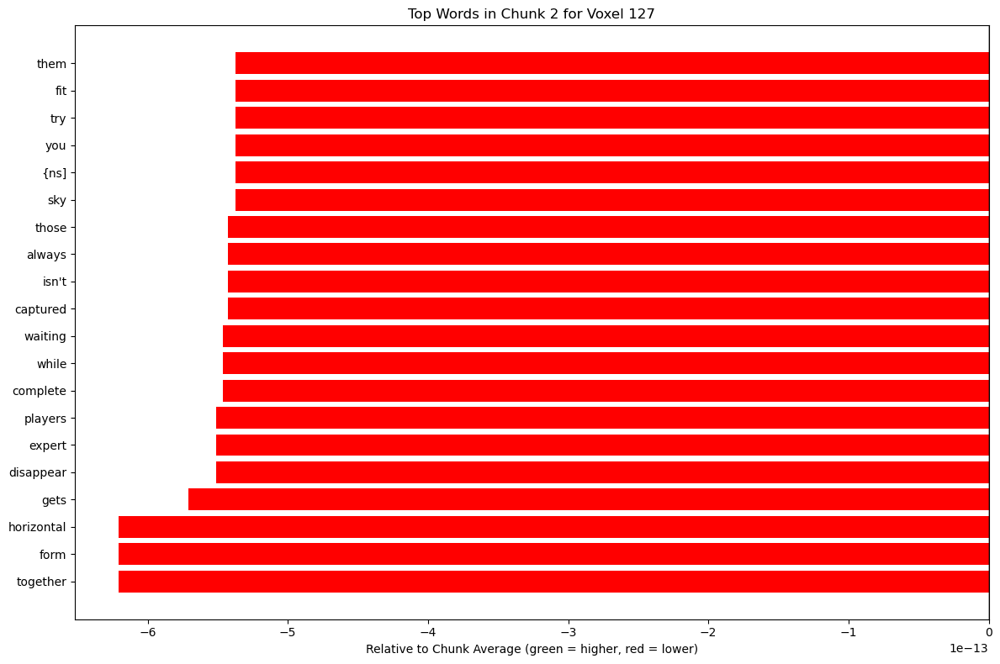

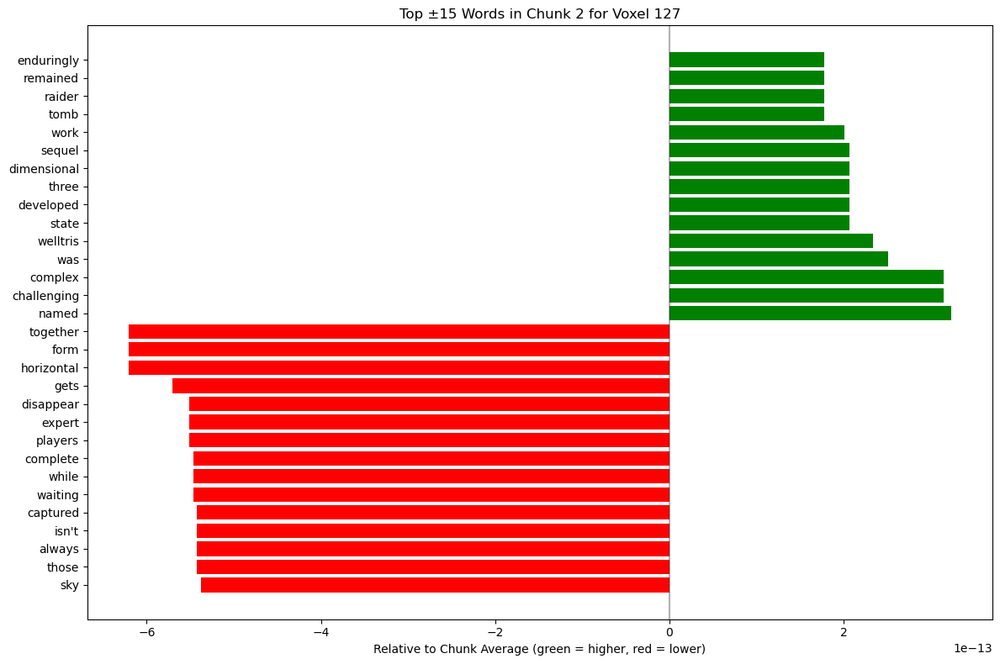


OVERALL RESULTS: TOP 30 WORDS ACROSS ALL CHUNKS


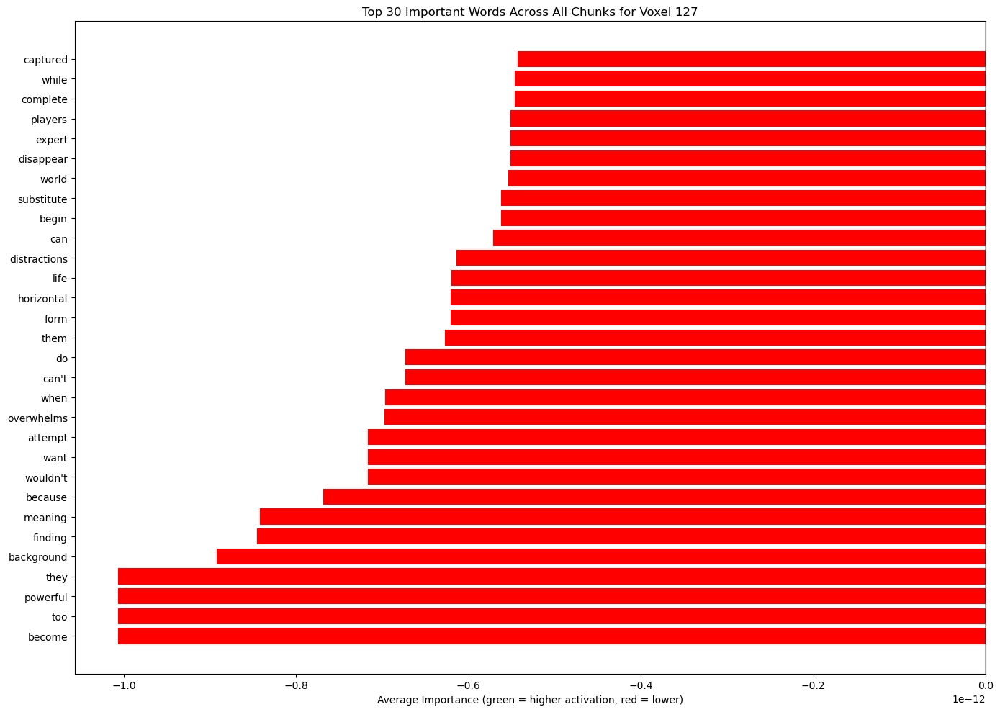

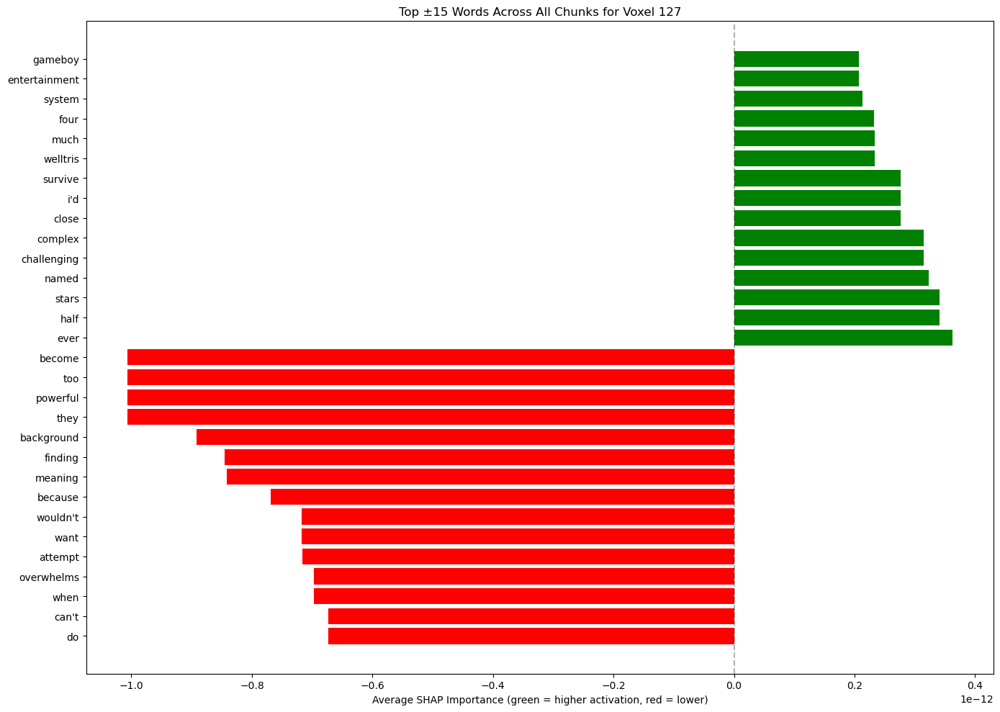


Top words with positive influence (higher activation):
  ever: 3.620737940180e-13
  half: 3.410102759226e-13
  stars: 3.410102759226e-13
  named: 3.233921114303e-13
  challenging: 3.146612727126e-13
  complex: 3.146612727126e-13
  close: 2.769099473939e-13
  i'd: 2.769099473939e-13
  survive: 2.769099473939e-13
  welltris: 2.335680233583e-13
  much: 2.335162892025e-13
  four: 2.327065219274e-13
  system: 2.125385253227e-13
  entertainment: 2.076730318268e-13
  gameboy: 2.076730318268e-13

Top words with negative influence (lower activation):
  become: -1.006544326257e-12
  too: -1.006544326257e-12
  powerful: -1.006544326257e-12
  they: -1.006544326257e-12
  background: -8.920170688521e-13
  finding: -8.452038685505e-13
  meaning: -8.421947354944e-13
  because: -7.688954502487e-13
  wouldn't: -7.170599847707e-13
  want: -7.170599847707e-13
  attempt: -7.166288535087e-13
  overwhelms: -6.972587043448e-13
  when: -6.965984557036e-13
  can't: -6.735082322597e-13
  do: -6.735082322597e-13

In [48]:
def comprehensive_shap_analysis(text, voxel_idx, chunk_size=200, overlap=50, max_chunks=5):
    words = text.split()
    print(f"Analyzing text with {len(words)} words for voxel {voxel_idx}")

    empty_pred = predict_voxel_simplified([""], voxel_idx)[0]
    print(f"Empty baseline prediction: {empty_pred}")
    full_pred = predict_voxel_simplified([text], voxel_idx)[0]
    print(f"Full text prediction: {full_pred}")
    print(f"Difference from baseline: {full_pred - empty_pred}")

    chunks, chunk_bounds = [], []
    for i in range(0, len(words), chunk_size - overlap):
        end = min(i + chunk_size, len(words))
        chunks.append(" ".join(words[i:end]))
        chunk_bounds.append((i, end))
        if len(chunks) >= max_chunks:
            break

    print(f"Created {len(chunks)} chunks for analysis")

    chunk_preds = []
    for i, chunk in enumerate(chunks):
        pred = predict_voxel_simplified([chunk], voxel_idx)[0]
        chunk_preds.append(pred)
        print(f"Chunk {i+1}: words {chunk_bounds[i][0]}-{chunk_bounds[i][1]}, prediction: {pred}")

    chunk_importance = [(i, abs(pred - empty_pred), pred) for i, pred in enumerate(chunk_preds)]
    chunk_importance.sort(key=lambda x: x[1], reverse=True)

    all_word_importances = {}
    top_chunks = min(3, len(chunks))

    for chunk_idx, importance, pred in chunk_importance[:top_chunks]:
        chunk = chunks[chunk_idx]
        start, end = chunk_bounds[chunk_idx]
        print(f"\n{'='*60}")
        print(f"Analyzing Chunk {chunk_idx+1} (words {start}-{end}, importance: {importance:.4f})")
        print(f"{'='*60}")
        print(chunk[:100] + "..." if len(chunk) > 100 else chunk)

        def relative_predict(text_array):
            preds = predict_voxel_simplified(text_array, voxel_idx)
            return preds - pred

        try:
            explainer = shap.Explainer(relative_predict, shap.maskers.Text(tokenizer, output_type="string"))
            shap_values = explainer([chunk])

            print("\nSHAP Text Highlighting (blue = higher than chunk average, red = lower):")
            shap.plots.text(shap_values[0])

            if hasattr(shap_values, 'values') and len(shap_values.values) > 0:
                values = shap_values.values[0]
                chunk_words = chunk.split()
                min_len = min(len(chunk_words), len(values))

                # Aggregate duplicate word SHAP values in this chunk
                from collections import defaultdict
                word_shap_dict = defaultdict(list)
                for i in range(min_len):
                    word_shap_dict[chunk_words[i]].append(values[i])
                word_values = [(word, np.mean(shap_list)) for word, shap_list in word_shap_dict.items()]

                for word, value in word_values:
                    all_word_importances.setdefault(word, []).append(value)

                word_values.sort(key=lambda x: x[1], reverse=True)
                positive_values = [(w, v) for w, v in word_values if v > 0]
                negative_values = [(w, v) for w, v in word_values if v < 0]

                if positive_values:
                    print("\nTop words with higher activation than chunk average:")
                    for word, value in positive_values[:10]:
                        print(f"  {word}: {value:.12e}")
                if negative_values:
                    print("\nTop words with lower activation than chunk average:")
                    for word, value in sorted(negative_values, key=lambda x: x[1])[:10]:
                        print(f"  {word}: {value:.12e}")

                # Plot 1: top 20 by absolute value
                word_values.sort(key=lambda x: abs(x[1]), reverse=True)
                top_n = min(20, len(word_values))
                plt.figure(figsize=(12, 8))
                plt.barh([w[0] for w in word_values[:top_n]],
                         [w[1] for w in word_values[:top_n]],
                         color=['green' if v > 0 else 'red' for _, v in word_values[:top_n]])
                plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
                plt.xlabel('Relative to Chunk Average (green = higher, red = lower)')
                plt.title(f'Top Words in Chunk {chunk_idx+1} for Voxel {voxel_idx}')
                plt.tight_layout()
                plt.show()

                # Plot 2: balanced ±15 word plot
                top_n_balanced = 15
                positive_words = sorted([(w, v) for w, v in word_values if v > 0], key=lambda x: x[1], reverse=True)
                negative_words = sorted([(w, v) for w, v in word_values if v < 0], key=lambda x: x[1])
                balanced_words = negative_words[:top_n_balanced][::-1] + positive_words[:top_n_balanced]

                plt.figure(figsize=(12, 8))
                plt.barh([w[0] for w in balanced_words],
                         [w[1] for w in balanced_words],
                         color=['red' if v < 0 else 'green' for _, v in balanced_words])
                plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
                plt.xlabel('Relative to Chunk Average (green = higher, red = lower)')
                plt.title(f'Top ±{top_n_balanced} Words in Chunk {chunk_idx+1} for Voxel {voxel_idx}')
                plt.tight_layout()
                plt.show()

        except Exception as e:
            print(f"Error analyzing chunk {chunk_idx+1}: {e}")

    # Final summary across all analyzed chunks
    if all_word_importances:
        avg_importances = {word: np.mean(vals) for word, vals in all_word_importances.items()}
        word_importance_pairs = sorted(avg_importances.items(), key=lambda x: abs(x[1]), reverse=True)
        top_n = min(30, len(word_importance_pairs))
        top_words = word_importance_pairs[:top_n]

        print("\n" + "="*60)
        print(f"OVERALL RESULTS: TOP {top_n} WORDS ACROSS ALL CHUNKS")
        print("="*60)

        # Plot: Overall top 30 by absolute SHAP
        plt.figure(figsize=(14, 10))
        plt.barh([w[0] for w in top_words],
                 [w[1] for w in top_words],
                 color=['green' if v > 0 else 'red' for _, v in top_words])
        plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)
        plt.xlabel('Average Importance (green = higher activation, red = lower)')
        plt.title(f'Top {top_n} Important Words Across All Chunks for Voxel {voxel_idx}')
        plt.tight_layout()
        plt.show()

        # Plot: Overall Top ±15 positive/negative across all chunks
        top_n_balanced = 15
        positive_words = sorted([(w, v) for w, v in word_importance_pairs if v > 0], key=lambda x: x[1], reverse=True)
        negative_words = sorted([(w, v) for w, v in word_importance_pairs if v < 0], key=lambda x: x[1])
        balanced_words = negative_words[:top_n_balanced][::-1] + positive_words[:top_n_balanced]

        plt.figure(figsize=(14, 10))
        plt.barh([w[0] for w in balanced_words],
                 [w[1] for w in balanced_words],
                 color=['red' if v < 0 else 'green' for _, v in balanced_words])
        plt.axvline(x=0, color='black', linestyle='--', alpha=0.3)
        plt.xlabel('Average SHAP Importance (green = higher activation, red = lower)')
        plt.title(f'Top ±{top_n_balanced} Words Across All Chunks for Voxel {voxel_idx}')
        plt.tight_layout()
        plt.show()

        # Print summary words
        positive_words = [(w, v) for w, v in word_importance_pairs if v > 0]
        negative_words = [(w, v) for w, v in word_importance_pairs if v < 0]

        if positive_words:
            print("\nTop words with positive influence (higher activation):")
            for word, value in positive_words[:15]:
                print(f"  {word}: {value:.12e}")
        if negative_words:
            print("\nTop words with negative influence (lower activation):")
            for word, value in sorted(negative_words, key=lambda x: x[1])[:15]:
                print(f"  {word}: {value:.12e}")

        return word_importance_pairs

    return []



# Run comprehensive analysis on the text
comprehensive_results = comprehensive_shap_analysis(test_story_text, 127, 
                                                   chunk_size=450, overlap=50, max_chunks=5)

## SHAP (test_story: 'tetris', voxel: 128)

Analyzing text with 1348 words for voxel 128
Empty baseline prediction: 6.432004452960235e-07
Full text prediction: 9.04698098391782e-07
Difference from baseline: 2.6149765309575857e-07
Created 4 chunks for analysis
Chunk 1: words 0-450, prediction: 9.04698098391782e-07
Chunk 2: words 400-850, prediction: 8.542711798753338e-07
Chunk 3: words 800-1250, prediction: 9.710923925651288e-07
Chunk 4: words 1200-1348, prediction: 7.2161066802802e-07

Analyzing Chunk 3 (words 800-1250, importance: 0.0000)
a high scoring accomplishment called a tetris as a kid i played tetris on my nintendo entertainment ...


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:59, 119.74s/it]              


SHAP Text Highlighting (blue = higher than chunk average, red = lower):



Top words with higher activation than chunk average:
  much: 4.486068360944e-09
  nintendo: 4.437469264738e-09
  entertainment: 4.437469264738e-09
  system: 4.437469264738e-09
  gameboy: 4.437469264738e-09
  kid: 4.307139163426e-09
  high: 3.961268329155e-09
  scoring: 3.961268329155e-09
  accomplishment: 3.961268329155e-09
  played: 3.416534395016e-09

Top words with lower activation than chunk average:
  garden: -5.433328991265e-09
  eat: -5.433328991265e-09
  love: -5.433328991265e-09
  write: -4.586342530380e-09
  read: -4.586342530380e-09
  magnificently: -4.025534071164e-09
  empty: -4.025534071164e-09
  enter: -4.025534071164e-09
  afford: -3.680249177325e-09
  indulge: -3.680249177325e-09


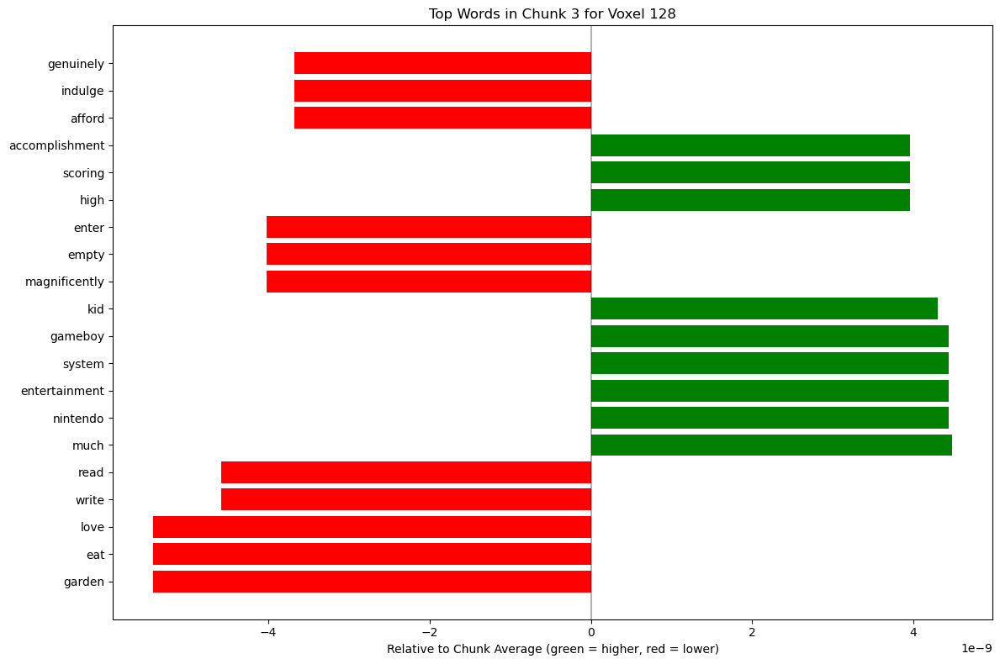

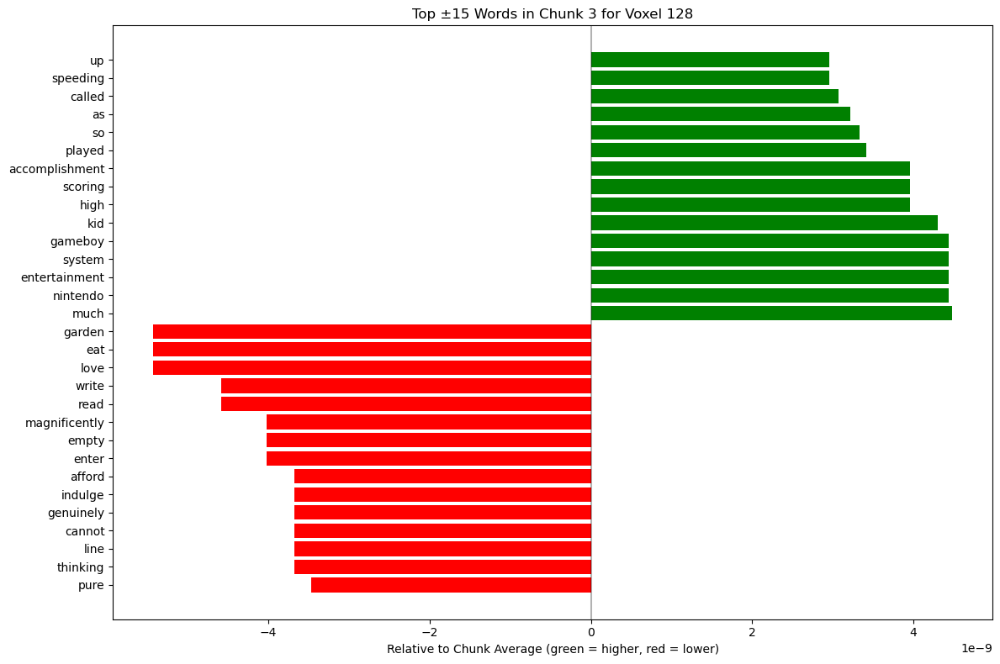


Analyzing Chunk 1 (words 0-450, importance: 0.0000)
let's start with tetris in june of nineteen eighty four the computer programmer alexey pajitnov was ...


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:00, 120.22s/it]              


SHAP Text Highlighting (blue = higher than chunk average, red = lower):



Top words with higher activation than chunk average:
  computer: 5.017724817746e-09
  programmer: 5.017724817746e-09
  working: 5.017724817746e-09
  let's: 4.938481113212e-09
  start: 4.938481113212e-09
  june: 4.938481113212e-09
  player: 4.614645354551e-09
  games: 4.518310830748e-09
  month: 4.518310830748e-09
  which: 3.804720450523e-09

Top words with lower activation than chunk average:
  complete: -6.877667265968e-09
  mess: -6.877667265968e-09
  courts: -6.877667265968e-09
  eventually: -6.877667265968e-09
  getting: -6.877667265968e-09
  involved: -6.877667265968e-09
  shook: -5.382306202617e-09
  available: -5.382306202617e-09
  six: -4.852729793024e-09
  different: -4.852729793024e-09


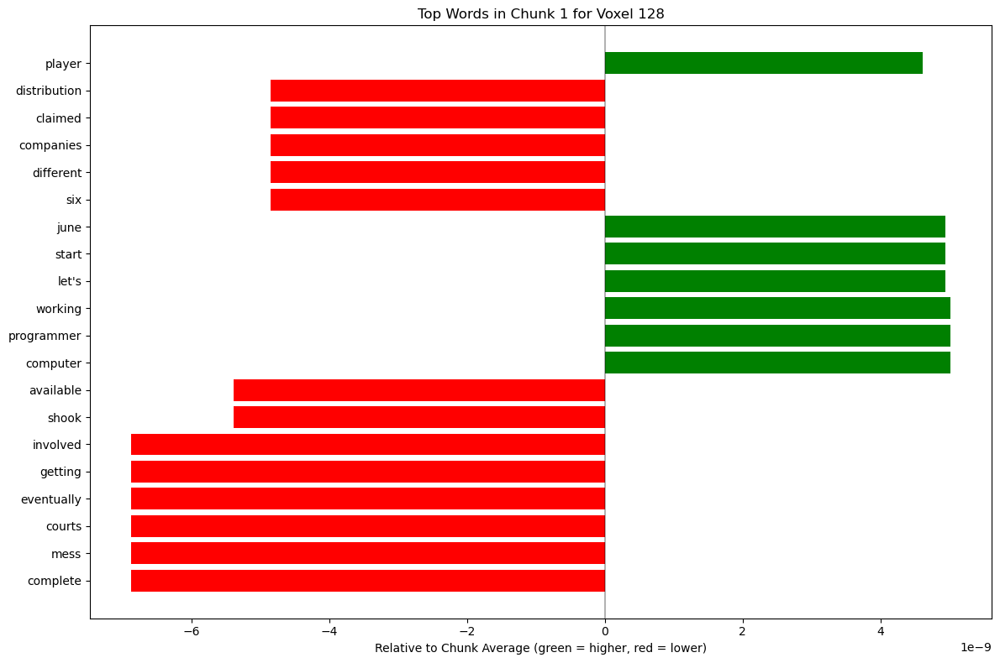

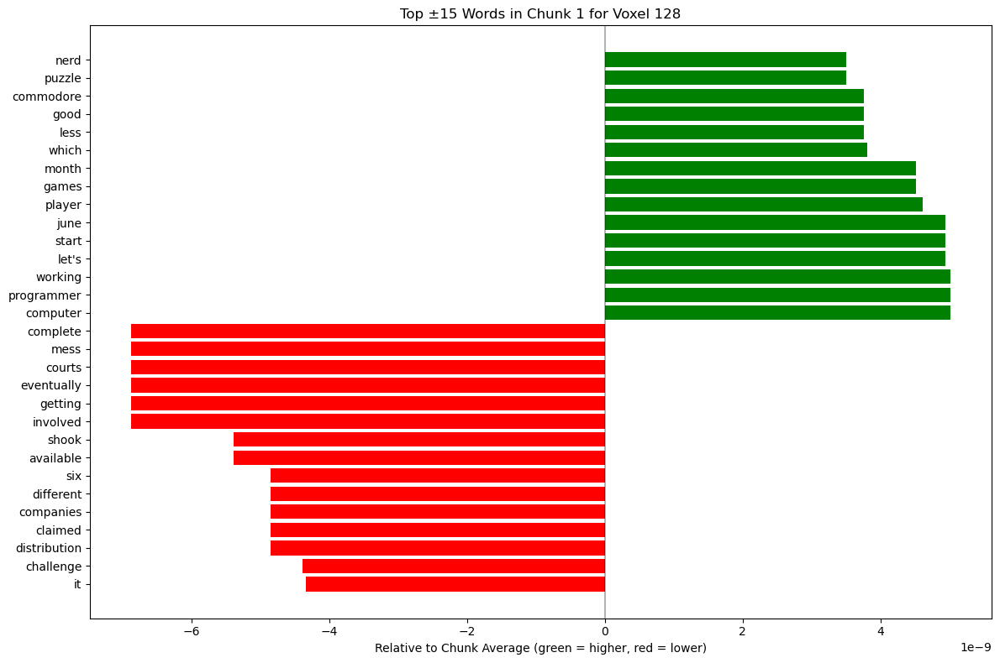


Analyzing Chunk 2 (words 400-850, importance: 0.0000)
and continued to work for the state he developed a three dimensional sequel to tetris named welltris...


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:58, 118.23s/it]              


SHAP Text Highlighting (blue = higher than chunk average, red = lower):



Top words with higher activation than chunk average:
  saw: 3.738462092005e-09
  release: 3.738462092005e-09
  duke: 3.738462092005e-09
  nuke: 3.738462092005e-09
  em: 3.738462092005e-09
  there: 3.368744120327e-09
  huge: 3.368744120327e-09
  surge: 3.368744120327e-09
  sales: 3.368744120327e-09
  tomb: 3.336200818013e-09

Top words with lower activation than chunk average:
  gets: -5.180731473470e-09
  got: -5.118252242602e-09
  rich: -5.118252242602e-09
  from: -5.118252242602e-09
  stockholders: -5.118252242602e-09
  genius: -5.031893485426e-09
  simplicity: -5.031893485426e-09
  value: -4.832360508485e-09
  licensing: -4.694730601629e-09
  middlemen: -4.694730601629e-09


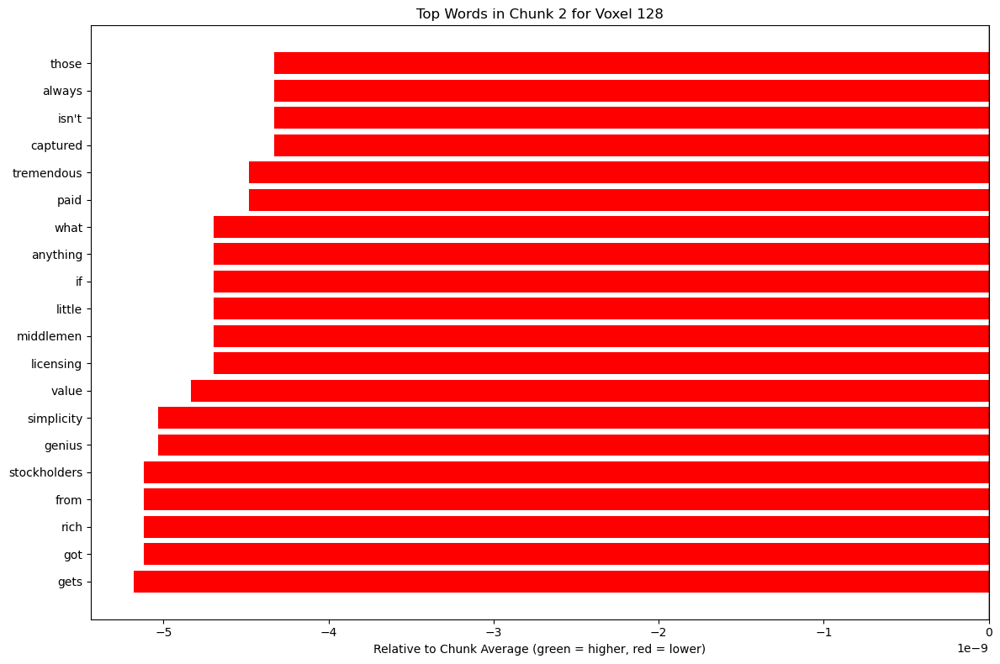

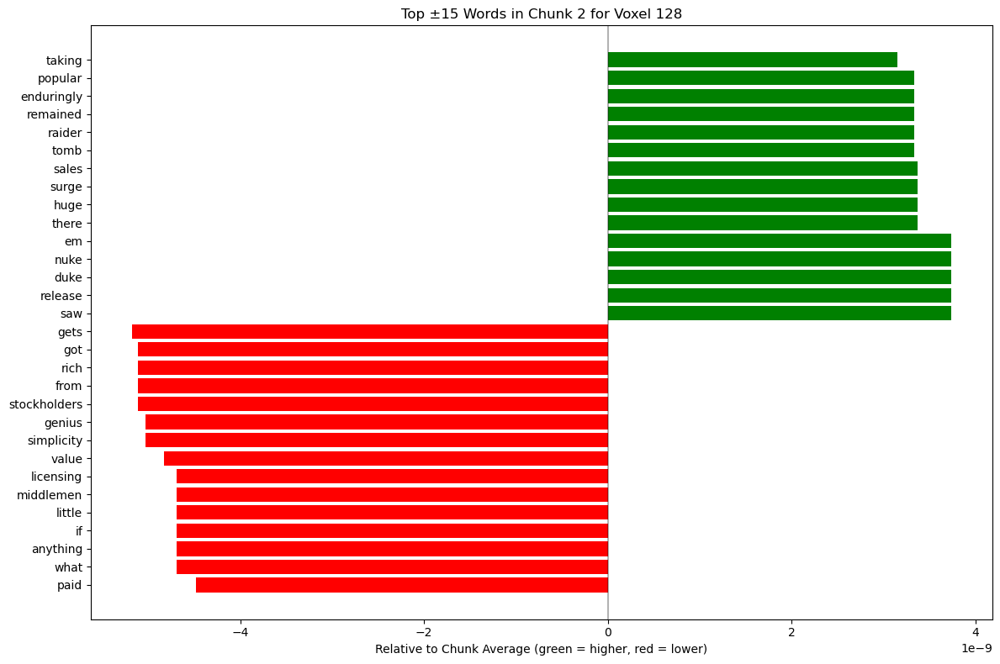


OVERALL RESULTS: TOP 30 WORDS ACROSS ALL CHUNKS


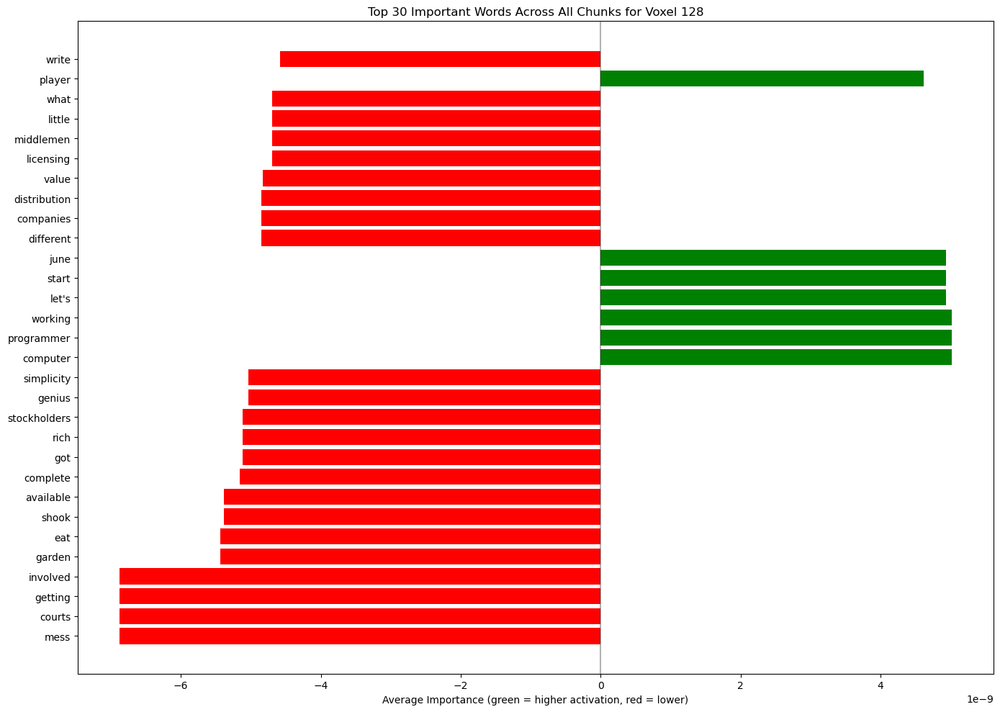

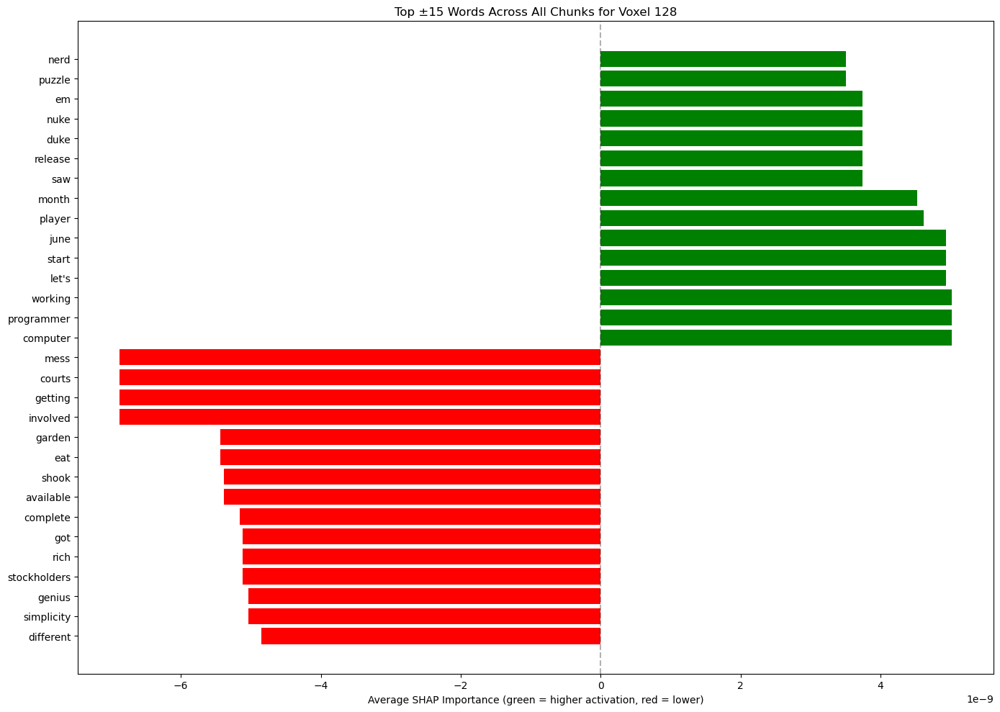


Top words with positive influence (higher activation):
  computer: 5.017724817746e-09
  programmer: 5.017724817746e-09
  working: 5.017724817746e-09
  let's: 4.938481113212e-09
  start: 4.938481113212e-09
  june: 4.938481113212e-09
  player: 4.614645354551e-09
  month: 4.518310830748e-09
  saw: 3.738462092005e-09
  release: 3.738462092005e-09
  duke: 3.738462092005e-09
  nuke: 3.738462092005e-09
  em: 3.738462092005e-09
  puzzle: 3.507575185994e-09
  nerd: 3.507575185994e-09

Top words with negative influence (lower activation):
  mess: -6.877667265968e-09
  courts: -6.877667265968e-09
  getting: -6.877667265968e-09
  involved: -6.877667265968e-09
  garden: -5.433328991265e-09
  eat: -5.433328991265e-09
  shook: -5.382306202617e-09
  available: -5.382306202617e-09
  complete: -5.162472428692e-09
  got: -5.118252242602e-09
  rich: -5.118252242602e-09
  stockholders: -5.118252242602e-09
  genius: -5.031893485426e-09
  simplicity: -5.031893485426e-09
  different: -4.852729793024e-09


In [49]:
# Run comprehensive analysis on the text
comprehensive_results = comprehensive_shap_analysis(test_story_text, 128, 
                                                   chunk_size=450, overlap=50, max_chunks=5)

## SHAP (test_story: tetris, voxel: 265)

Analyzing text with 1348 words for voxel 265
Empty baseline prediction: -3.785300259517964e-06
Full text prediction: -4.761940797038921e-06
Difference from baseline: -9.766405375209571e-07
Created 4 chunks for analysis
Chunk 1: words 0-450, prediction: -4.761940797038921e-06
Chunk 2: words 400-850, prediction: -4.513700561796282e-06
Chunk 3: words 800-1250, prediction: -5.010453192528784e-06
Chunk 4: words 1200-1348, prediction: -4.865697702190779e-06

Analyzing Chunk 3 (words 800-1250, importance: 0.0000)
a high scoring accomplishment called a tetris as a kid i played tetris on my nintendo entertainment ...


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:56, 116.34s/it]              


SHAP Text Highlighting (blue = higher than chunk average, red = lower):



Top words with lower activation than chunk average:
  brief: -9.465079140672e-09
  will: -9.112745868420e-09
  miraculous: -8.908642395271e-09
  flicker: -8.908642395271e-09
  consciousness: -8.908642395271e-09
  been: -8.908642395271e-09
  anything: -8.785755781461e-09
  least: -8.785755781461e-09
  fear: -8.133639866117e-09
  vast: -8.133639866117e-09


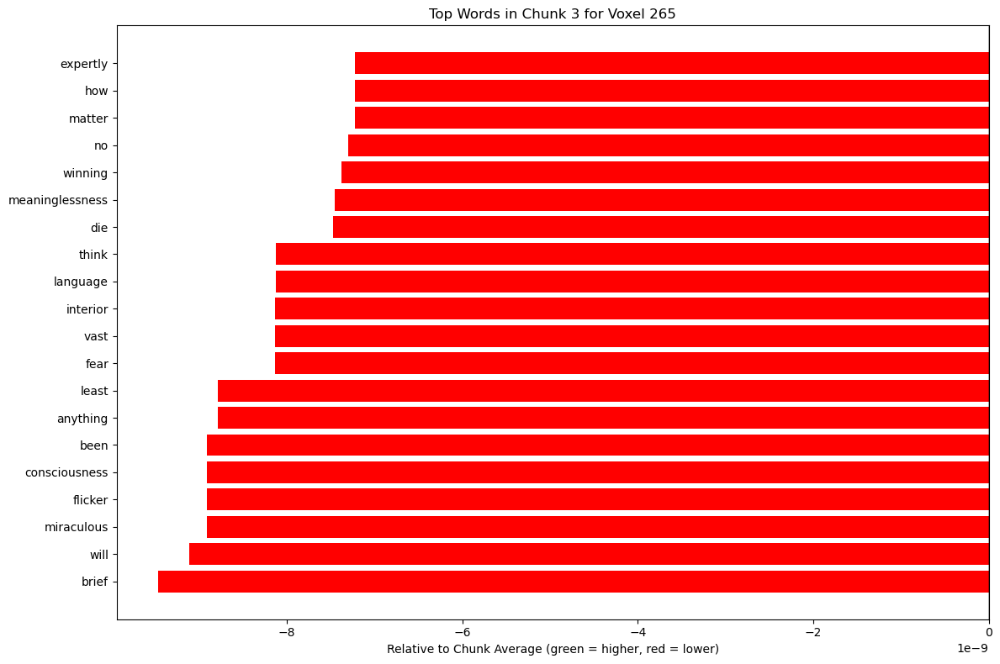

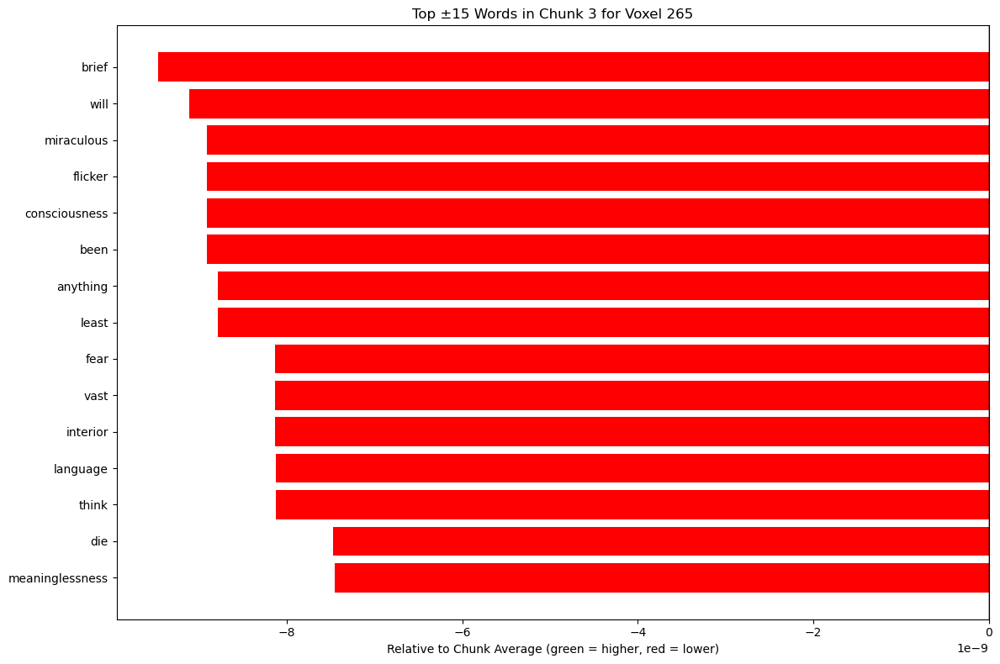


Analyzing Chunk 4 (words 1200-1348, importance: 0.0000)
of course such pain must be confronted and dealt with carefully considered and battled against there...


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:01, 61.51s/it]               


SHAP Text Highlighting (blue = higher than chunk average, red = lower):



Top words with lower activation than chunk average:
  gift: -2.879989871359e-08
  world: -2.473948942264e-08
  because: -2.473948942264e-08
  also: -2.460536905762e-08
  a: -2.377887199254e-08
  are: -2.330677949824e-08
  at: -2.278458253075e-08
  distracting: -2.278458253075e-08
  from: -2.254952785974e-08
  times: -2.056021989057e-08


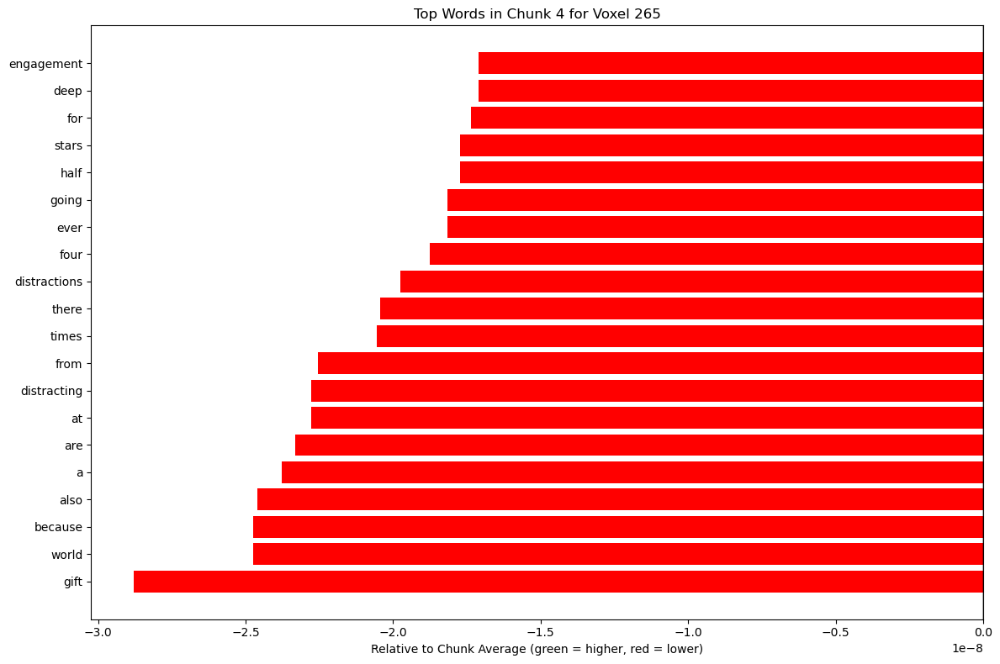

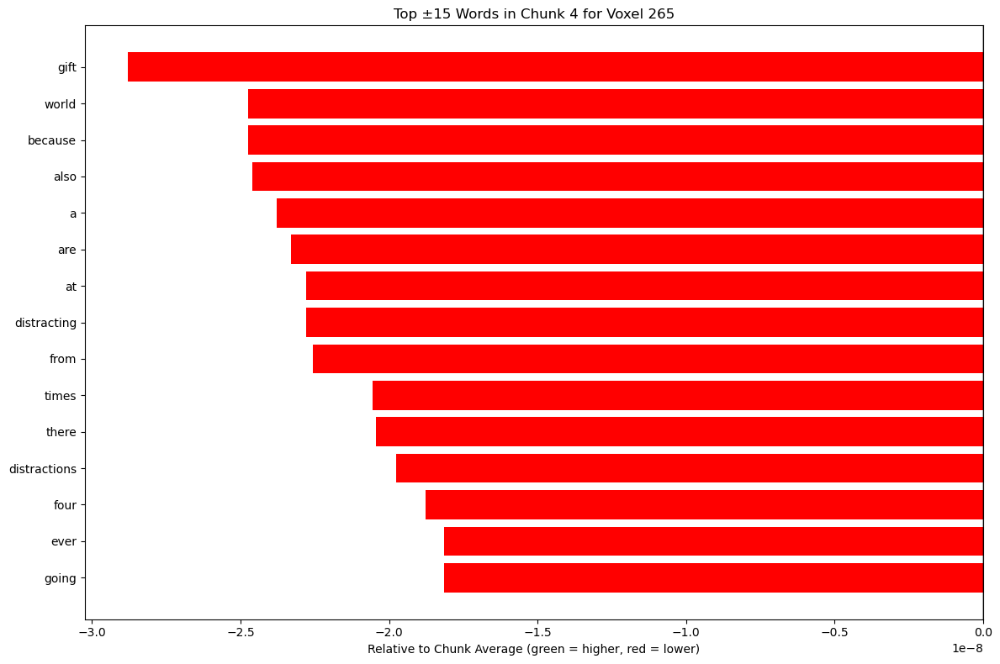


Analyzing Chunk 1 (words 0-450, importance: 0.0000)
let's start with tetris in june of nineteen eighty four the computer programmer alexey pajitnov was ...


  0%|          | 0/498 [00:00<?, ?it/s]

In [ ]:
# Run comprehensive analysis on the text
comprehensive_results = comprehensive_shap_analysis(test_story_text, 265, 
                                                   chunk_size=450, overlap=50, max_chunks=5)

## LME (test_story: tetris, voxel: 127)

<>:39: SyntaxWarning: invalid escape sequence '\s'
<>:39: SyntaxWarning: invalid escape sequence '\s'
/var/tmp/ipykernel_12882/1103409420.py:39: SyntaxWarning: invalid escape sequence '\s'
  split_expression='\s+'


Analyzing 1348 words in 3 chunks with LIME

Analyzing Chunk 3/3 with LIME (Prediction: -0.0000)
get it i could watch friends play tetris for hours even now i find watching replays of the tetris wo...

Top words identified by LIME:
  tetris: 0.001105
  but: -0.000390
  that: -0.000331
  stack: 0.000211
  perfect: 0.000183
  wouldn't: 0.000169
  matter: -0.000158
  i'd: 0.000153
  an: 0.000150
  course: 0.000144
  in: -0.000080
  time: -0.000065
  attempt: 0.000041
  them: -0.000041
  never: -0.000015


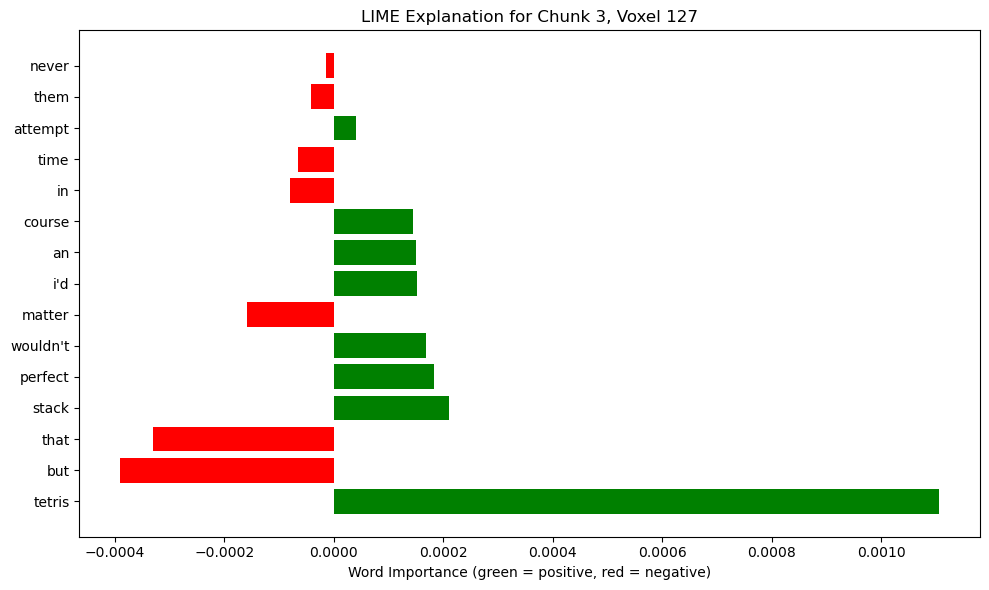


Analyzing Chunk 2/3 with LIME (Prediction: -0.0000)
continues which ultimately proved to be untrue the soviet union collapsed later that year so pajutno...

Top words identified by LIME:
  tetris: 0.000816
  the: -0.000652
  pajitnov: 0.000475
  time: 0.000362
  effect: 0.000245
  i: -0.000182
  by: 0.000181
  jeffrey: 0.000145
  creative: 0.000125
  geometric: 0.000120
  into: 0.000103
  later: -0.000096
  memory: -0.000031
  of: 0.000030
  what: -0.000016


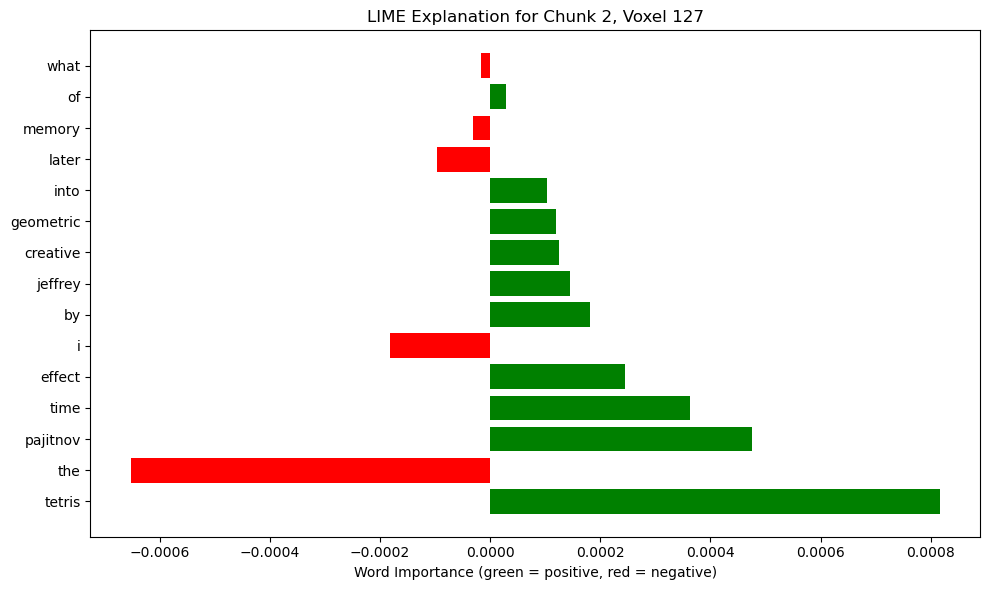


Analyzing Chunk 1/3 with LIME (Prediction: -0.0000)
let's start with tetris in june of nineteen eighty four the computer programmer alexey pajitnov was ...

Top words identified by LIME:
  tetris: 0.000902
  the: -0.000580
  pajitnov: 0.000366
  tagline: 0.000337
  tetramino: 0.000249
  work: 0.000201
  lead: 0.000078
  available: -0.000062
  while: 0.000048
  employee: 0.000041
  mess: 0.000041
  less: -0.000023
  totalitarian: -0.000022
  composed: -0.000020
  is: 0.000015


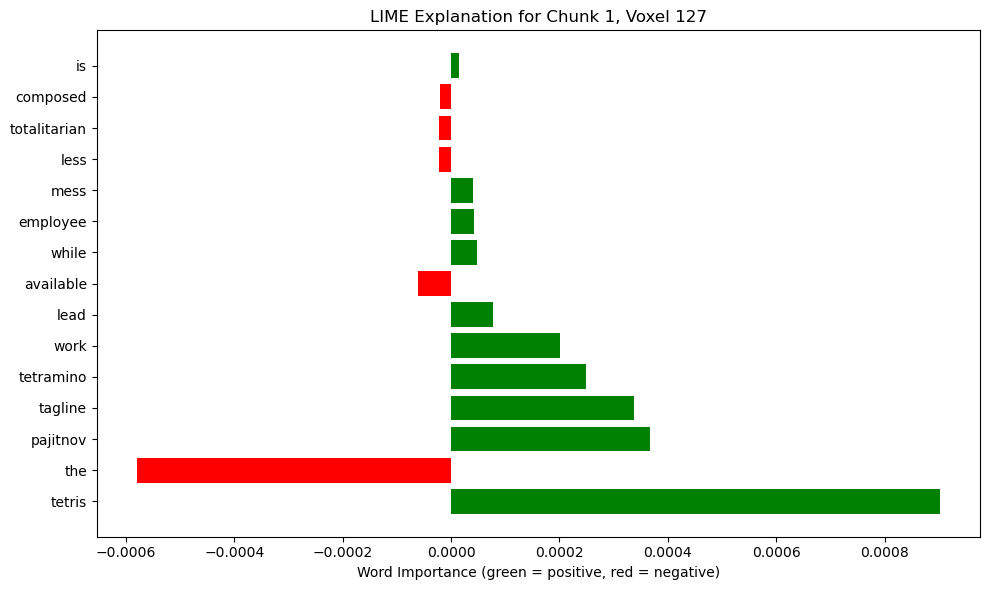

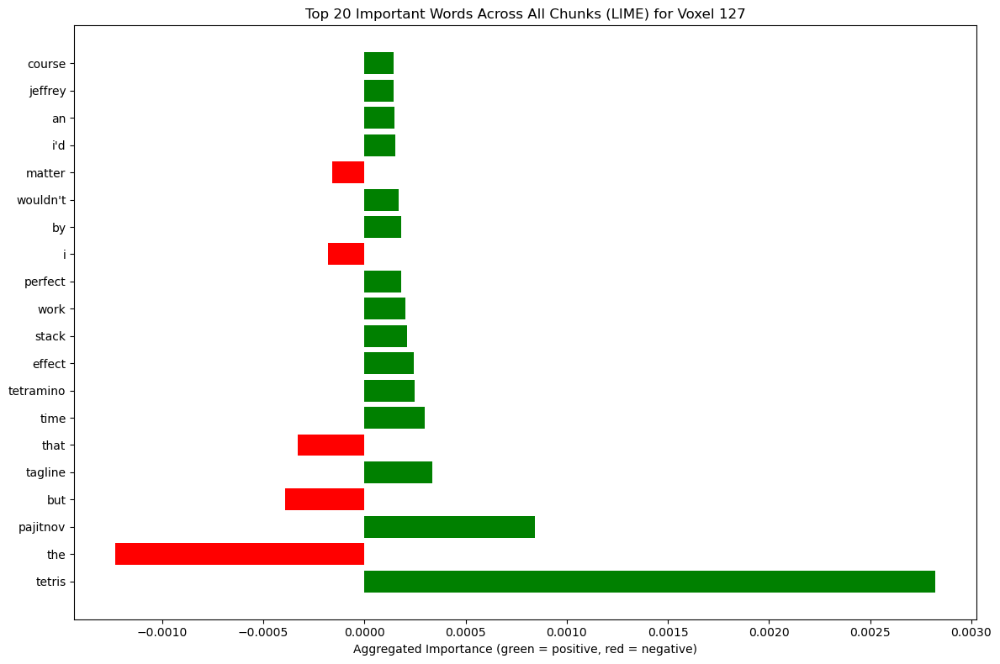

In [31]:
import numpy as np
import matplotlib.pyplot as plt
import lime
from lime.lime_text import LimeTextExplainer

def explain_with_lime_full_text(text, voxel_idx, chunk_size=450):
    """
    Run LIME explanation on full text by chunking and analyzing most important parts.
    
    Args:
        text: The full story text
        voxel_idx: The voxel to analyze
        chunk_size: Number of words per chunk
    """
    # Split text into words and then chunks
    words = text.split()
    chunks = [' '.join(words[i:i+chunk_size]) for i in range(0, len(words), chunk_size)]
    
    print(f"Analyzing {len(words)} words in {len(chunks)} chunks with LIME")
    
    # First pass - identify which chunks are most important
    chunk_importance = []
    for i, chunk in enumerate(chunks):
        # Get prediction for this chunk
        pred = predict_voxel_simplified([chunk], voxel_idx)[0]
        chunk_importance.append((i, pred, chunk))
    
    # Sort chunks by prediction value (importance)
    chunk_importance.sort(key=lambda x: abs(x[1]), reverse=True)
    
    top_chunks = chunk_importance[:3]
    
    # Analysis results storage
    all_explanations = []
    
    # Create explainer with appropriate class names
    explainer = lime.lime_text.LimeTextExplainer(
        class_names=['inactive', 'active'],
        split_expression='\s+'
    )
    
    # Analyze each important chunk with LIME
    for idx, pred_value, chunk in top_chunks:
        print(f"\n{'='*50}")
        print(f"Analyzing Chunk {idx+1}/{len(chunks)} with LIME (Prediction: {pred_value:.4f})")
        print(f"{'='*50}")
        print(chunk[:100] + "...")
        
        # Define prediction function for LIME
        def predict_for_lime(texts):
            preds = predict_voxel_simplified(texts, voxel_idx)
            # Scale predictions to [0,1] range
            preds_normalized = (preds - np.min(preds)) / (np.max(preds) - np.min(preds) + 1e-8)
            return np.column_stack((1-preds_normalized, preds_normalized))
        
        # Generate explanation
        try:
            exp = explainer.explain_instance(
                chunk, 
                predict_for_lime, 
                num_features=15,
                num_samples=300
            )
            
            # Show explanation as list
            explanation = exp.as_list()
            print("\nTop words identified by LIME:")
            for word, score in explanation:
                print(f"  {word}: {score:.6f}")
            
            # Store for later aggregation
            all_explanations.extend(explanation)
            
            # Show visualization in notebook
            exp.show_in_notebook(text=True)
            
            # Create bar chart
            plt.figure(figsize=(10, 6))
            words, scores = zip(*explanation)
            # Sort by absolute importance
            sorted_indices = np.argsort(np.abs(scores))[::-1]
            words = [words[i] for i in sorted_indices]
            scores = [scores[i] for i in sorted_indices]
            
            plt.barh(range(len(words)), scores,
                     color=['green' if s > 0 else 'red' for s in scores])
            plt.yticks(range(len(words)), words)
            plt.xlabel('Word Importance (green = positive, red = negative)')
            plt.title(f'LIME Explanation for Chunk {idx+1}, Voxel {voxel_idx}')
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Error running LIME on chunk: {e}")
    
    # Aggregate results across all analyzed chunks
    if all_explanations:
        word_dict = {}
        for word, val in all_explanations:
            if word not in word_dict:
                word_dict[word] = 0
            word_dict[word] += val
        
        # Convert back to list and sort by absolute importance
        combined_importance = [(word, val) for word, val in word_dict.items()]
        combined_importance.sort(key=lambda x: abs(x[1]), reverse=True)
        
        # Plot top words across all chunks
        plt.figure(figsize=(12, 8))
        top_n = min(20, len(combined_importance))
        top_words = combined_importance[:top_n]
        
        plt.barh(range(len(top_words)), 
                 [val for _, val in top_words],
                 color=['green' if val > 0 else 'red' for _, val in top_words])
        plt.yticks(range(len(top_words)), [word for word, _ in top_words])
        plt.xlabel('Aggregated Importance (green = positive, red = negative)')
        plt.title(f'Top {top_n} Important Words Across All Chunks (LIME) for Voxel {voxel_idx}')
        plt.tight_layout()
        plt.show()
    
    return combined_importance

# Run LIME on full text for a specific voxel
voxel_to_explain = 127
important_words_lime = explain_with_lime_full_text(test_story_text, voxel_to_explain)

## LIME (test_story: tetris, voxel: 128)

Analyzing 1348 words in 3 chunks with LIME

Analyzing Chunk 1/3 with LIME (Prediction: 0.0000)
let's start with tetris in june of nineteen eighty four the computer programmer alexey pajitnov was ...

Top words identified by LIME:
  and: 0.055560
  of: -0.031793
  the: 0.031157
  in: 0.028974
  game's: 0.018589
  tetris: -0.018218
  ending: 0.015278
  welltris: 0.013966
  go: 0.012145
  puzzle: 0.009870
  also: 0.009838
  boy: -0.006509
  four: 0.005469
  under: 0.003611
  other: 0.001809


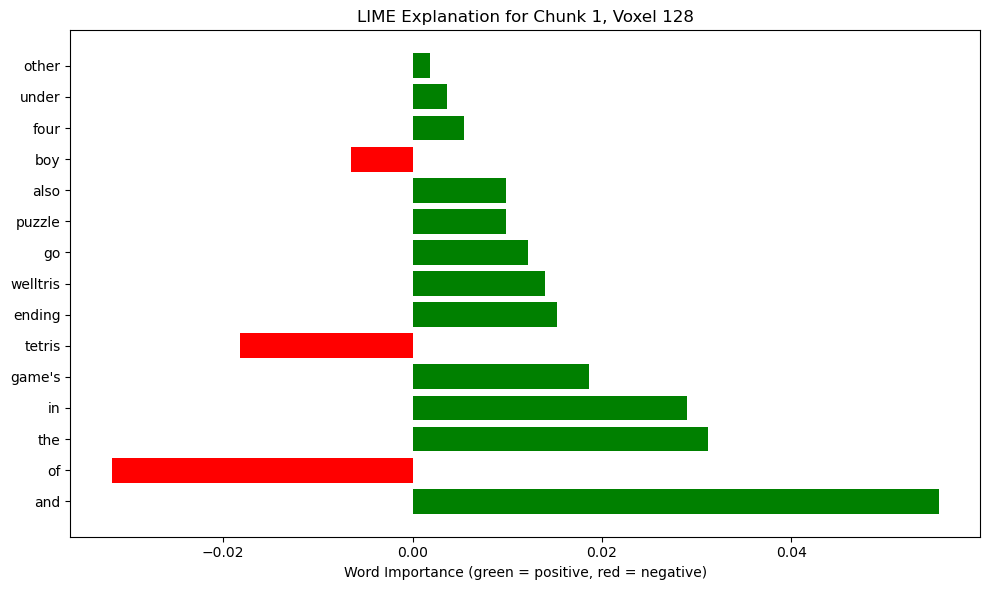


Analyzing Chunk 3/3 with LIME (Prediction: 0.0000)
get it i could watch friends play tetris for hours even now i find watching replays of the tetris wo...

Top words identified by LIME:
  i: 0.057227
  arrival: 0.025808
  the: 0.021848
  stars: 0.019402
  confronted: -0.018583
  wouldn't: -0.012661
  become: 0.012038
  space: 0.009101
  line: -0.007985
  bad: 0.004316
  effective: -0.004067
  must: -0.002194
  thinking: -0.002132
  miraculous: 0.001166
  with: -0.001029


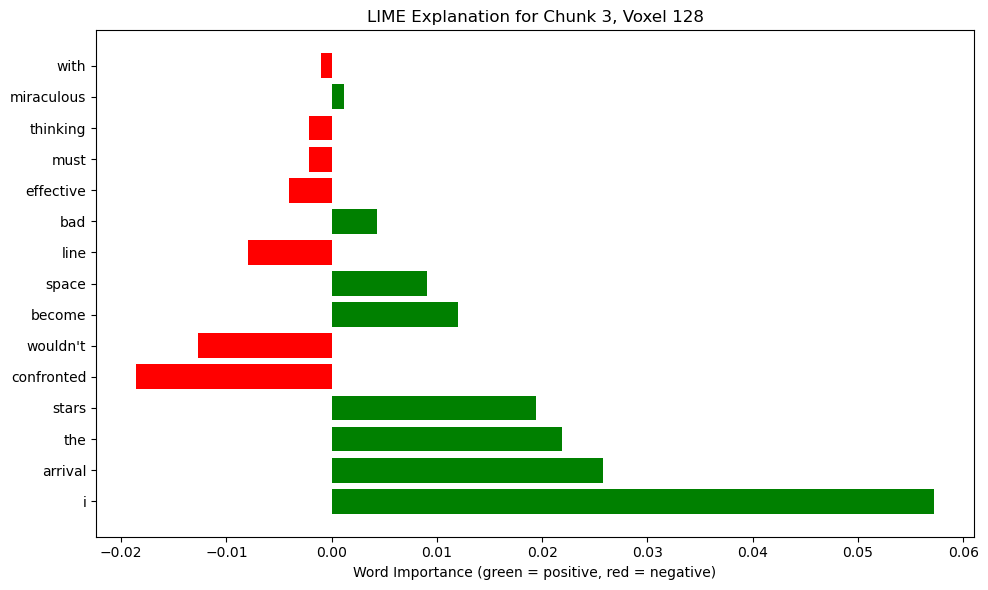


Analyzing Chunk 2/3 with LIME (Prediction: 0.0000)
continues which ultimately proved to be untrue the soviet union collapsed later that year so pajutno...


In [ ]:
voxel_to_explain = 128
important_words_lime = explain_with_lime_full_text(test_story_text, voxel_to_explain)

## LIME (test_story: tetris, voxel: 265)


In [ ]:
voxel_to_explain = 265
important_words_lime = explain_with_lime_full_text(test_story_text, voxel_to_explain)

# SHAP Test Story 2: myfathershands

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import os

# Choose a test story to analyze
test_story_key = 'myfathershands' 

# Load the saved model data
subject = 'subject3'
model_path = f'../results/ridge_model_{subject}_BERT.pkl'

with open(model_path, 'rb') as f:
    model_data = pickle.load(f)

# Get voxel performance for this story
story_performances = model_data['metrics']['story_performances']
story_voxel_corrs = story_performances[test_story_key]['correlations']

# Select top-N voxels where model performs well
top_n = 3
top_voxel_indices = np.argsort(story_voxel_corrs)[-top_n:][::-1]
top_voxel_corrs = story_voxel_corrs[top_voxel_indices]

print(f"Analysis for test story: '{test_story_key}'")
print(f"Top {top_n} voxels:")
for i, (idx, corr) in enumerate(zip(top_voxel_indices, top_voxel_corrs)):
    print(f"  Voxel {idx}: correlation = {corr:.4f}")

In [ ]:
from transformers import AutoTokenizer, AutoModel
import torch
import numpy as np

# Get the story text using the same approach as shown
story_words = rawdata[test_story_key].data
test_story_text = " ".join(story_words)

print(f"Selected story: {test_story_key}")
print(f"Story length: {len(story_words)} words")
print("First 100 words:", " ".join(story_words[:100]), "...")

# Setup BERT tokenizer
tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')

# Function to predict voxel activation
def predict_voxel_simplified(texts, voxel_idx):
    """
    Predict activation for a list of text inputs for a specific voxel.
    Returns a NumPy array of predictions.
    """
    preds = []

    for text in texts:
        inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=512)

        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            last_hidden = outputs.hidden_states[-1]  # get last hidden state
            embeddings = last_hidden.mean(dim=1).numpy()

        if model_data['weights'].shape[0] == 3072:
            extended_embed = np.tile(embeddings, (1, 4)).reshape(-1)
        else:
            extended_embed = embeddings.reshape(-1)

        weights = model_data['weights'][:, voxel_idx]
        pred = np.dot(extended_embed, weights)
        preds.append(pred)

    return np.array(preds)

    return np.array(preds)


## SHAP (test_story: myfathershands, voxel: 143)

In [ ]:
# Run comprehensive analysis on the text
comprehensive_results = comprehensive_shap_analysis(test_story_text, 143, 
                                                   chunk_size=450, overlap=50, max_chunks=5)

## SHAP (test_story: myfathershands, voxel: 155)

In [ ]:
# Run comprehensive analysis on the text
comprehensive_results = comprehensive_shap_analysis(test_story_text, 155, 
                                                   chunk_size=450, overlap=50, max_chunks=5)

## SHAP (test_story: myfathershands, voxel: 160)

In [ ]:
# Run comprehensive analysis on the text
comprehensive_results = comprehensive_shap_analysis(test_story_text, 160, 
                                                   chunk_size=450, overlap=50, max_chunks=5)

## LIME (test_story: myfathershands, voxel: 143)


In [ ]:
voxel_to_explain = 143
important_words_lime = explain_with_lime_full_text(test_story_text, voxel_to_explain)

## LIME (test_story: myfathershands, voxel: 155)

In [ ]:
voxel_to_explain = 155
important_words_lime = explain_with_lime_full_text(test_story_text, voxel_to_explain)

## LIME (test_story: myfathershands, voxel: 160)

In [ ]:
voxel_to_explain = 160
important_words_lime = explain_with_lime_f‚ull_text(test_story_text, voxel_to_explain)